# Forest Segmentation with Deep Learning - PyTorch Implementation

## Conversion Notes

This notebook is a **pure PyTorch** implementation of the TensorFlow/Keras Experimentation.ipynb notebook.

### Key Differences from TensorFlow Version

1. **Channel Ordering**: TensorFlow (H,W,C) → PyTorch (C,H,W)
2. **Data Pipeline**: ImageDataGenerator → albumentations + Dataset/DataLoader  
3. **Model Architecture**: Keras functional API → PyTorch nn.Module
4. **Training**: model.fit() → Custom training loop
5. **Custom Layers**: 
   - Attention: tf.broadcast_to() → tensor.expand_as()
   - Max unpooling: Custom TF layer → nn.MaxUnpool2d
   - Bilinear resize: tf.image.resize() → F.interpolate()

### Models Implemented
1. U-Net
2. Attention U-Net (PRIMARY)
3. ResNet50-SegNet
4. FCN32-VGG16
5. ResUNet

In [1]:
# Load PyTorch and Essential Libraries
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import sys

# Data augmentation
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Standard libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image
import os
import pathlib
from tqdm import tqdm

# Geospatial data
import rioxarray as rxr
import rasterio

# Metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score

# File operations
import requests
import pyunpack
from rarfile import RarFile

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')
if torch.cuda.is_available():
    print(f'GPU: {torch.cuda.get_device_name(0)}')
    print(f'Memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.2f} GB')

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)

Using device: cuda
GPU: NVIDIA GeForce RTX 4070 Laptop GPU
Memory: 8.00 GB


## Data Download

Download the three datasets used in this experiment:
1. RGB Amazon Forest Dataset
2. 4-band Amazon Dataset  
3. 4-band Atlantic Forest Dataset

In [ ]:
# Specify whether to download data or read in
download = True
base_dir = r"./Amazon Forest Dataset/"

In [ ]:
# This cell contains the same data download code as the TensorFlow notebook
# (Keep the original data download code here)

os.makedirs(base_dir, exist_ok=True)

if download:
    url = 'https://zenodo.org/record/3233081/files/Amazon%20Forest%20Dataset.rar?download=1'
    r = requests.get(url, allow_redirects=True)
    open('data.rar', 'wb').write(r.content)

    if sys.platform != 'darwin':
        pyunpack.Archive('data.rar').extractall('')

    else:
        with RarFile('data.rar') as rf:
            rf.extractall()

In [ ]:
Image.open(r"{}Training/images/Amazon_1110.tiff_25.tiff".format(base_dir))

In [ ]:
download = True # True, if files don't already exist in same directory
base_dir2 = r"./AMAZON/"

In [ ]:
# Download data (Amazon)

if download:
    url = 'https://zenodo.org/record/4498086/files/AMAZON.rar?download=1'
    r = requests.get(url, allow_redirects=True)
    open('data2.rar', 'wb').write(r.content)

    if sys.platform != 'darwin':
        pyunpack.Archive('data2.rar').extractall('')

    else:
        with RarFile('data2.rar') as rf:
            rf.extractall()


In [ ]:

plt.imshow((np.array(rxr.open_rasterio(r"{}Training/image/{}".format(base_dir2,training_images_list2[20])))[0,:,:]))

In [ ]:
download = True # True if files don't already exist in same directory
base_dir3 = r"./ATLANTIC FOREST/"

In [ ]:
# Download data (Atlantic Forest)
if download:
    url = 'https://zenodo.org/record/4498086/files/ATLANTIC%20FOREST.rar?download=1'
    r = requests.get(url, allow_redirects=True)
    open('data3.rar', 'wb').write(r.content)

    if sys.platform != 'darwin':
        pyunpack.Archive('data3.rar').extractall('')

    else:
        with RarFile('data3.rar') as rf:
            rf.extractall()


## Utility Functions

### Prediction and Evaluation Functions

In [2]:
# Prediction Functions

def predict_single(model, image, device='cuda'):
    """
    Predict mask for a single image.
    
    Args:
        model: PyTorch model
        image: input image (C, H, W) or (H, W, C) numpy array
        device: computation device
    
    Returns:
        prediction: numpy array (H, W)
    """
    model.eval()
    
    # Handle different input formats
    if isinstance(image, np.ndarray):
        # Remove batch dimension if present
        if image.ndim == 4:
            image = image.squeeze(0)
        
        # Convert (H, W, C) to (C, H, W) if needed
        if image.ndim == 3 and image.shape[2] in [3, 4]:
            image = torch.from_numpy(image).permute(2, 0, 1).unsqueeze(0).float()
        elif image.ndim == 3:
            image = torch.from_numpy(image).unsqueeze(0).float()
        else:
            image = torch.from_numpy(image).unsqueeze(0).unsqueeze(0).float()
    
    # Ensure 4D tensor (B, C, H, W)
    if image.ndim == 3:
        image = image.unsqueeze(0)
    
    image = image.to(device)
    
    with torch.no_grad():
        output = model(image)
    
    # Convert to numpy (H, W)
    prediction = output.squeeze().cpu().numpy()
    
    return prediction

def reconstruct_image(model, image, rounded=False, device='cuda'):
    """
    Reconstruct image prediction (matches TF function).
    
    Args:
        model: PyTorch model
        image: input image
        rounded: whether to round predictions to binary
        device: computation device
    
    Returns:
        prediction: numpy array (H, W)
    """
    pred = predict_single(model, image, device)
    
    if rounded:
        pred = np.round(pred)
    
    return pred

def reconstruct_array(model, image, rounded=False, device='cuda'):
    """
    Alias for reconstruct_image (matches TF function).
    """
    return reconstruct_image(model, image, rounded, device)

# Evaluation Metrics

def score_eval(model, images, masks, num_channels=3, device='cuda'):
    """
    Compute accuracy score (matches TF function).
    
    Args:
        model: PyTorch model
        images: list of images or single image array
        masks: list of masks or single mask array
        num_channels: 3 for RGB, 4 for 4-band
        device: computation device
    
    Returns:
        accuracy score or list of scores
    """
    model.eval()
    
    # Handle single image case
    if not isinstance(images, list) and images.ndim <= 4:
        pred = predict_single(model, images, device)
        pred = np.round(pred).flatten()
        
        mask = masks
        if mask.ndim == 4:
            mask = mask.squeeze(0)
        if mask.ndim == 3:
            mask = mask.squeeze(-1)
        
        return accuracy_score(mask.flatten(), pred)
    
    # Handle multiple images
    scores = []
    for i in range(len(images)):
        img = images[i]
        mask = masks[i]
        
        if img.ndim == 4:
            img = img.squeeze(0)
        if mask.ndim == 4:
            mask = mask.squeeze(0)
        if mask.ndim == 3:
            mask = mask.squeeze(-1)
        
        pred = predict_single(model, img, device)
        pred = np.round(pred).flatten()
        
        score = accuracy_score(mask.flatten(), pred)
        scores.append(score)
    
    return scores

def score_eval2(model, images, masks, device='cuda'):
    """
    Accuracy for 4-band data (matches TF function).
    """
    return score_eval(model, images, masks, num_channels=4, device=device)

def precision_eval(model, images, masks, num_channels=3, device='cuda'):
    """
    Compute precision score (matches TF function).
    """
    model.eval()
    
    if not isinstance(images, list) and images.ndim <= 4:
        pred = predict_single(model, images, device)
        pred = np.round(pred).flatten()
        
        mask = masks
        if mask.ndim == 4:
            mask = mask.squeeze(0)
        if mask.ndim == 3:
            mask = mask.squeeze(-1)
        
        return precision_score(mask.flatten(), pred, average='weighted', zero_division=0)
    
    precisions = []
    for i in range(len(images)):
        img = images[i]
        mask = masks[i]
        
        if img.ndim == 4:
            img = img.squeeze(0)
        if mask.ndim == 4:
            mask = mask.squeeze(0)
        if mask.ndim == 3:
            mask = mask.squeeze(-1)
        
        pred = predict_single(model, img, device)
        pred = np.round(pred).flatten()
        
        precision = precision_score(mask.flatten(), pred, average='weighted', zero_division=0)
        precisions.append(precision)
    
    return precisions

def recall_eval(model, images, masks, num_channels=3, device='cuda'):
    """
    Compute recall score (matches TF function).
    """
    model.eval()
    
    if not isinstance(images, list) and images.ndim <= 4:
        pred = predict_single(model, images, device)
        pred = np.round(pred).flatten()
        
        mask = masks
        if mask.ndim == 4:
            mask = mask.squeeze(0)
        if mask.ndim == 3:
            mask = mask.squeeze(-1)
        
        return recall_score(mask.flatten(), pred, average='weighted', zero_division=0)
    
    recalls = []
    for i in range(len(images)):
        img = images[i]
        mask = masks[i]
        
        if img.ndim == 4:
            img = img.squeeze(0)
        if mask.ndim == 4:
            mask = mask.squeeze(0)
        if mask.ndim == 3:
            mask = mask.squeeze(-1)
        
        pred = predict_single(model, img, device)
        pred = np.round(pred).flatten()
        
        recall = recall_score(mask.flatten(), pred, average='weighted', zero_division=0)
        recalls.append(recall)
    
    return recalls

def f1_score_eval(model, images, masks, num_channels=3, device='cuda'):
    """
    Compute F1 score (matches TF function).
    """
    prec = np.mean(precision_eval(model, images, masks, num_channels, device))
    rec = np.mean(recall_eval(model, images, masks, num_channels, device))
    
    if prec + rec == 0:
        return 0
    
    return 2 * (prec * rec) / (prec + rec)

def f1_score_eval_basic(precision, recall):
    """
    Compute F1 from precision and recall lists (matches TF function).
    """
    if isinstance(precision, list):
        prec = np.mean(precision)
    else:
        prec = precision
    
    if isinstance(recall, list):
        rec = np.mean(recall)
    else:
        rec = recall
    
    if prec + rec == 0:
        return 0
    
    return 2 * (prec * rec) / (prec + rec)

### Training Infrastructure

In [21]:
# Training Functions

def compute_metrics(pred, target):
    """
    Compute accuracy and MSE metrics.
    Matches TensorFlow metrics=['accuracy', 'mse'].
    
    Args:
        pred: predicted masks (B, 1, H, W)
        target: ground truth masks (B, 1, H, W)
    
    Returns:
        accuracy, mse
    """

    # 1. Convert Logits to Probabilities for Metrics
    probs = torch.sigmoid(pred)

    pred_binary = (probs > 0.5).float()
    
    # Accuracy: percentage of correct pixels
    accuracy = (pred_binary == target).float().mean().item()
    
    # MSE: mean squared error
    mse = F.mse_loss(probs, target).item()
    
    return accuracy, mse

def train_model(model, train_loader, val_loader, criterion, optimizer,
                num_epochs=30, steps_per_epoch=100, device='cuda',
                save_path='model.pth', verbose=1):
    """
    Training loop matching TensorFlow model.fit().
    
    Args:
        model: PyTorch model
        train_loader: training DataLoader
        val_loader: validation DataLoader
        criterion: loss function
        optimizer: optimizer
        num_epochs: number of epochs
        steps_per_epoch: iterations per epoch (matches TF)
        device: 'cuda' or 'cpu'
        save_path: path to save best model
        verbose: print frequency (0=silent, 1=progress bar, 2=one line per epoch)
    
    Returns:
        history: dict with training metrics
    """
    model.to(device)
    best_val_acc = 0.0
    
    history = {
        'loss': [],
        'accuracy': [],
        'mse': [],
        'val_loss': [],
        'val_accuracy': [],
        'val_mse': []
    }
    
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        train_loss = 0.0
        train_acc = 0.0
        train_mse = 0.0
        
        # Create iterator and control steps per epoch
        train_iter = iter(train_loader)
        
        # Progress bar for training
        if verbose == 1:
            pbar = tqdm(range(steps_per_epoch), desc=f'Epoch {epoch+1}/{num_epochs}')
        else:
            pbar = range(steps_per_epoch)
        
        for step in pbar:
            try:
                images, masks = next(train_iter)
            except StopIteration:
                # Reset iterator when exhausted
                train_iter = iter(train_loader)
                images, masks = next(train_iter)
            
            images = images.to(device)
            #masks = masks.to(device)
            masks = masks.to(device).float()

            if len(masks.shape) == 3:#
                masks = masks.unsqueeze(1)#
            
            # Forward pass
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            
            # Backward pass
            loss.backward()
            optimizer.step()
            
            # Compute metrics
            acc, mse = compute_metrics(outputs, masks)
            
            train_loss += loss.item()
            train_acc += acc
            train_mse += mse
            
            # Update progress bar
            if verbose == 1:
                pbar.set_postfix({
                    'loss': f'{loss.item():.4f}',
                    'acc': f'{acc:.4f}'
                })
        
        # Average training metrics
        train_loss /= steps_per_epoch
        train_acc /= steps_per_epoch
        train_mse /= steps_per_epoch
        
        # Validation phase
        model.eval()
        val_loss = 0.0
        val_acc = 0.0
        val_mse = 0.0
        
        with torch.no_grad():
            for images, masks in val_loader:
                images = images.to(device)
                masks = masks.to(device).float()

                if len(masks.shape) == 3:#
                    masks = masks.unsqueeze(1)#
                
                outputs = model(images)
                loss = criterion(outputs, masks)
                
                acc, mse = compute_metrics(outputs, masks)
                
                val_loss += loss.item()
                val_acc += acc
                val_mse += mse
        
        val_loss /= len(val_loader)
        val_acc /= len(val_loader)
        val_mse /= len(val_loader)
        
        # Save best model (matching ModelCheckpoint behavior)
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_acc': val_acc,
                'val_loss': val_loss
            }, save_path)
            if verbose >= 1:
                print(f"\nEpoch {epoch+1}: val_accuracy improved to {val_acc:.4f}, saving model to {save_path}")
        
        # Store history
        history['loss'].append(train_loss)
        history['accuracy'].append(train_acc)
        history['mse'].append(train_mse)
        history['val_loss'].append(val_loss)
        history['val_accuracy'].append(val_acc)
        history['val_mse'].append(val_mse)
        
        # Print epoch summary
        if verbose == 2 or (verbose == 1 and epoch % 5 == 0):
            print(f"Epoch {epoch+1}/{num_epochs} - "
                  f"loss: {train_loss:.4f} - acc: {train_acc:.4f} - mse: {train_mse:.4f} - "
                  f"val_loss: {val_loss:.4f} - val_acc: {val_acc:.4f} - val_mse: {val_mse:.4f}")
    
    return history

def plot_training_history(history, save_path=None):
    """
    Plot training history matching TensorFlow style.
    
    Args:
        history: dict with keys ['loss', 'accuracy', 'val_loss', 'val_accuracy']
        save_path: optional path to save figure
    """
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    
    # Accuracy plot
    axes[0].plot(history['accuracy'], label='Training')
    axes[0].plot(history['val_accuracy'], label='Validation')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title('Model Accuracy')
    axes[0].legend(loc='upper left')
    axes[0].grid(True)
    
    # Loss plot
    axes[1].plot(history['loss'], label='Training')
    axes[1].plot(history['val_loss'], label='Validation')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].set_title('Model Loss')
    axes[1].legend(loc='upper left')
    axes[1].grid(True)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    
    plt.show()

## Model Architectures

Implementing all 5 segmentation models in PyTorch.

### Standard U-Net

In [4]:
# Model 1: Standard U-Net

class UNet(nn.Module):
    """
    Standard U-Net architecture.
    Matches TensorFlow implementation exactly.
    
    Architecture:
    - Encoder: 4 blocks (64→128→256→512 filters)
    - Bottleneck: 1024 filters
    - Decoder: 4 blocks with skip connections
    - Output: sigmoid activation
    """
    def __init__(self, in_channels=3, out_channels=1, init_features=64):
        super(UNet, self).__init__()
        
        features = init_features
        
        # Encoder
        self.encoder1 = self._conv_block(in_channels, features)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        self.encoder2 = self._conv_block(features, features * 2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        self.encoder3 = self._conv_block(features * 2, features * 4)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        self.encoder4 = self._conv_block(features * 4, features * 8)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Bottleneck
        self.bottleneck = self._conv_block(features * 8, features * 16)
        
        # Decoder
        self.upconv4 = nn.ConvTranspose2d(features * 16, features * 8, kernel_size=2, stride=2)
        self.decoder4 = self._conv_block((features * 8) * 2, features * 8)
        
        self.upconv3 = nn.ConvTranspose2d(features * 8, features * 4, kernel_size=2, stride=2)
        self.decoder3 = self._conv_block((features * 4) * 2, features * 4)
        
        self.upconv2 = nn.ConvTranspose2d(features * 4, features * 2, kernel_size=2, stride=2)
        self.decoder2 = self._conv_block((features * 2) * 2, features * 2)
        
        self.upconv1 = nn.ConvTranspose2d(features * 2, features, kernel_size=2, stride=2)
        self.decoder1 = self._conv_block(features * 2, features)
        
        # Output
        self.conv_out = nn.Conv2d(features, out_channels, kernel_size=1)

        self._init_weights()

    def _init_weights(self):
        """
        Replicates `kernel_initializer='he_normal'` from TensorFlow.
        """
        for m in self.modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                # He Normal (aka Kaiming Normal)
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
        
    def _conv_block(self, in_channels, out_channels):
        """
        Convolutional block: Conv2D → ReLU → Conv2D → ReLU.
        Matches Keras convBlock2() function.
        """
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        # Encoder
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))
        
        # Bottleneck
        bottleneck = self.bottleneck(self.pool4(enc4))
        
        # Decoder with skip connections
        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat([dec4, enc4], dim=1)
        dec4 = self.decoder4(dec4)
        
        dec3 = self.upconv3(dec4)
        dec3 = torch.cat([dec3, enc3], dim=1)
        dec3 = self.decoder3(dec3)
        
        dec2 = self.upconv2(dec3)
        dec2 = torch.cat([dec2, enc2], dim=1)
        dec2 = self.decoder2(dec2)
        
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat([dec1, enc1], dim=1)
        dec1 = self.decoder1(dec1)
        
        # Output with sigmoid
        out = self.conv_out(dec1) #torch.sigmoid(self.conv_out(dec1))
        
        return out

### Attention U-Net

In [5]:
# Model 2: Attention U-Net (PRIMARY MODEL)

class AttentionBlock(nn.Module):
    """
    Attention Gate for Attention U-Net.
    
    Implements the attention mechanism from:
    "Attention U-Net: Learning Where to Look for the Pancreas"
    
    TensorFlow operations converted:
    - K.int_shape() → tensor.shape
    - tf.broadcast_to() → tensor.expand_as()
    - multiply() → *
    """
    def __init__(self, F_g, F_l, F_int):
        """
        Args:
            F_g: number of filters in gating signal
            F_l: number of filters in skip connection
            F_int: number of intermediate filters
        """
        super(AttentionBlock, self).__init__()
        
        # Gating signal pathway
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            #nn.BatchNorm2d(F_int)
        )
        
        # Skip connection pathway
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            #nn.BatchNorm2d(F_int)
        )
        
        # Attention coefficient
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            #nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self, g, x):
        """
        Args:
            g: gating signal from decoder (coarser scale)
            x: skip connection from encoder (finer scale)
        
        Returns:
            attention-weighted skip connection
        """
        # Process gating signal
        g1 = self.W_g(g)
        
        # Process skip connection with max pooling to match gating size
        # TF: MaxPooling2D((2,2))(theta_x)

        x1 = self.W_x(x)
        x1 = F.max_pool2d(x1, kernel_size=2, stride=2)

        # Combine and apply attention
        # TF: add([phi_g, theta_x])
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        
        # Upsample attention map to match skip connection size
        # TF: UpSampling2D(...) then tf.broadcast_to()
        psi = F.interpolate(psi, size=x.shape[2:], mode='bilinear', align_corners=True)
        
        # Apply attention: multiply with skip connection
        # TF: multiply([upsample_psi, x])
        out = x * psi
        
        return out

class AttentionUNet(nn.Module):
    """
    Attention U-Net architecture.
    Matches TensorFlow UNetAM implementation.
    
    Architecture:
    - Encoder: 4 blocks with progressive filters
    - Bottleneck: Highest filter count
    - Decoder: 4 blocks with attention gates
    - Attention gates applied at each decoder level
    """
    def __init__(self, in_channels=3, out_channels=1, filter_base=16):
        """
        Args:
            in_channels: input channels (3 for RGB, 4 for 4-band)
            out_channels: output channels (1 for binary)
            filter_base: base number of filters (16 in original)
        """
        super(AttentionUNet, self).__init__()
        
        # Calculate filter sizes matching TensorFlow
        # filters = [16, 32, 64, 128, 256]
        filters = [filter_base * (2**i) for i in range(5)]
        
        # Encoder
        self.encoder1 = self._conv_block(in_channels, filters[0])
        self.pool1 = nn.MaxPool2d(2, 2)
        
        self.encoder2 = self._conv_block(filters[0], filters[1])
        self.pool2 = nn.MaxPool2d(2, 2)
        
        self.encoder3 = self._conv_block(filters[1], filters[2])
        self.pool3 = nn.MaxPool2d(2, 2)
        
        self.encoder4 = self._conv_block(filters[2], filters[3])
        self.pool4 = nn.MaxPool2d(2, 2)
        
        # Bottleneck
        self.bottleneck = self._conv_block(filters[3], filters[4])
        
        # Attention gates
        self.att4 = AttentionBlock(F_g=filters[4], F_l=filters[3], F_int=filters[3])
        self.att3 = AttentionBlock(F_g=filters[3], F_l=filters[2], F_int=filters[2])
        self.att2 = AttentionBlock(F_g=filters[2], F_l=filters[1], F_int=filters[1])
        self.att1 = AttentionBlock(F_g=filters[1], F_l=filters[0], F_int=filters[0])
        
        # Decoder
        self.upconv4 = nn.ConvTranspose2d(filters[4], filters[3], kernel_size=2, stride=2)
        self.decoder4 = self._conv_block(filters[4], filters[3])
        
        self.upconv3 = nn.ConvTranspose2d(filters[3], filters[2], kernel_size=2, stride=2)
        self.decoder3 = self._conv_block(filters[3], filters[2])
        
        self.upconv2 = nn.ConvTranspose2d(filters[2], filters[1], kernel_size=2, stride=2)
        self.decoder2 = self._conv_block(filters[2], filters[1])
        
        self.upconv1 = nn.ConvTranspose2d(filters[1], filters[0], kernel_size=2, stride=2)
        self.decoder1 = self._conv_block(filters[1], filters[0])
        
        # Output
        self.conv_out = nn.Conv2d(filters[0], out_channels, kernel_size=1)

        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
        
    def _conv_block(self, in_channels, out_channels):
        """
        Matches convBlock2 from TensorFlow.
        Two convolutions with ReLU activations.
        """
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        # Encoder
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))
        
        # Bottleneck
        bottleneck = self.bottleneck(self.pool4(enc4))
        
        # Decoder with attention gates
        # Level 4
        d4 = self.upconv4(bottleneck)
        enc4_att = self.att4(g=bottleneck, x=enc4)
        d4 = torch.cat([d4, enc4_att], dim=1)
        d4 = self.decoder4(d4)
        
        # Level 3
        d3 = self.upconv3(d4)
        enc3_att = self.att3(g=d4, x=enc3)
        d3 = torch.cat([d3, enc3_att], dim=1)
        d3 = self.decoder3(d3)
        
        # Level 2
        d2 = self.upconv2(d3)
        enc2_att = self.att2(g=d3, x=enc2)
        d2 = torch.cat([d2, enc2_att], dim=1)
        d2 = self.decoder2(d2)
        
        # Level 1
        d1 = self.upconv1(d2)
        enc1_att = self.att1(g=d2, x=enc1)
        d1 = torch.cat([d1, enc1], dim=1)#torch.cat([d1, enc1_att], dim=1)#torch.cat([d1, enc1], dim=1)#torch.cat([d1, enc1_att], dim=1)
        d1 = self.decoder1(d1)
        
        # Output
        out = self.conv_out(d1)#torch.sigmoid(self.conv_out(d1))
        
        return out

### ResNet50-SegNet

In [27]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class PlainBlock(nn.Module):
    """
    Replicates 'resnetConvDownBlock' and the conv part of 'resnetConvUpBlock'.
    - 3 Sequential Convolutions
    - No Batch Norm
    - No Residual Connection
    """
    def __init__(self, in_channels, out_channels, kernel_size=3):
        super(PlainBlock, self).__init__()
        # Keras uses 'same' padding with ZeroPadding2D((1,1)) -> Conv2D valid
        # We can simulate this with padding=1 in Conv2d
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size, padding=1)
        self.relu1 = nn.ReLU(inplace=True)
        
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size, padding=1)
        self.relu2 = nn.ReLU(inplace=True)
        
        self.conv3 = nn.Conv2d(out_channels, out_channels, kernel_size, padding=1)
        self.relu3 = nn.ReLU(inplace=True)
        
        # Initialize weights to match 'he_normal'
        for m in [self.conv1, self.conv2, self.conv3]:
            nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')

    def forward(self, x):
        x = self.relu1(self.conv1(x))
        x = self.relu2(self.conv2(x))
        x = self.relu3(self.conv3(x))
        return x

class KerasSegNetReplicated(nn.Module):
    def __init__(self, in_channels=3, n_classes=1, filters=64):
        super(KerasSegNetReplicated, self).__init__()
        
        # --- Encoder ---
        # Block 1
        self.enc1 = PlainBlock(in_channels, filters)
        self.pool1 = nn.MaxPool2d(2, 2, return_indices=True)
        
        # Block 2
        self.enc2 = PlainBlock(filters, filters * 2)
        self.pool2 = nn.MaxPool2d(2, 2, return_indices=True)
        
        # Block 3
        self.enc3 = PlainBlock(filters * 2, filters * 4)
        self.pool3 = nn.MaxPool2d(2, 2, return_indices=True)
        
        # Block 4
        self.enc4 = PlainBlock(filters * 4, filters * 8)
        self.pool4 = nn.MaxPool2d(2, 2, return_indices=True)
        
        # Block 5
        self.enc5 = PlainBlock(filters * 8, filters * 16)
        self.pool5 = nn.MaxPool2d(2, 2, return_indices=True)
        
        # --- Decoder ---
        # The Keras decoder uses UpSampling (Nearest) + Conv + Add(MaxUnpool)
        self.unpool_layer = nn.MaxUnpool2d(2, 2)
        
        # Decoder 5
        self.dec5_conv = PlainBlock(filters * 16, filters * 16)
        
        # Decoder 4
        self.dec4_conv = PlainBlock(filters * 16, filters * 8)
        
        # Decoder 3
        self.dec3_conv = PlainBlock(filters * 8, filters * 4)
        
        # Decoder 2
        self.dec2_conv = PlainBlock(filters * 4, filters * 2)
        
        # Decoder 1
        self.dec1_conv = PlainBlock(filters * 2, filters)
        
        # Output
        self.final_conv = nn.Conv2d(filters, n_classes, kernel_size=1)
        
        
    def forward(self, x):
        # --- Encoder Phase ---
        e1 = self.enc1(x)
        p1, idx1 = self.pool1(e1)
        
        e2 = self.enc2(p1)
        p2, idx2 = self.pool2(e2)
        
        e3 = self.enc3(p2)
        p3, idx3 = self.pool3(e3)
        
        e4 = self.enc4(p3)
        p4, idx4 = self.pool4(e4)
        
        e5 = self.enc5(p4)
        p5, idx5 = self.pool5(e5)
        
        # --- Decoder Phase ---
        
        # Block 5_ (Input is p5)
        # Keras Logic: Upsample -> ConvBlock. No skip addition for the first block.
        d5 = F.interpolate(p5, scale_factor=2, mode='nearest')
        d5 = self.dec5_conv(d5) 
        
        # Block 4_ (Input is d5, Skip is Unpool(p4))
        d4_skip = self.unpool_layer(p4, idx4, output_size=e4.size())
        d4 = F.interpolate(d5, scale_factor=2, mode='nearest')
        d4 = self.dec4_conv(d4)
        d4 = d4 + d4_skip # The specific Keras addition
        
        # Block 3_
        d3_skip = self.unpool_layer(p3, idx3, output_size=e3.size())
        d3 = F.interpolate(d4, scale_factor=2, mode='nearest')
        d3 = self.dec3_conv(d3)
        d3 = d3 + d3_skip
        
        # Block 2_
        d2_skip = self.unpool_layer(p2, idx2, output_size=e2.size())
        d2 = F.interpolate(d3, scale_factor=2, mode='nearest')
        d2 = self.dec2_conv(d2)
        d2 = d2 + d2_skip
        
        # Block 1_
        d1_skip = self.unpool_layer(p1, idx1, output_size=e1.size())
        d1 = F.interpolate(d2, scale_factor=2, mode='nearest')
        d1 = self.dec1_conv(d1)
        d1 = d1 + d1_skip
        
        # Output
        out = self.final_conv(d1)
        return out

### FCN32-VGG16

In [ ]:
import torch
import torch.nn as nn

class FCN32VGG16(nn.Module):
    """
    Strict replication of the Keras FCN32-VGG16 architecture.
    """
    def __init__(self, in_channels=3, out_channels=1, dropout=0.0): # Changed default to 0.0 to match Keras
        super(FCN32VGG16, self).__init__()
        
        # --- Encoder (VGG16) ---
        # Block 1
        self.block1 = self._vgg_block(in_channels, 64, 2)
        self.pool1 = nn.MaxPool2d(2, 2)
        
        # Block 2
        self.block2 = self._vgg_block(64, 128, 2)
        self.pool2 = nn.MaxPool2d(2, 2)
        
        # Block 3
        self.block3 = self._vgg_block(128, 256, 3)
        self.pool3 = nn.MaxPool2d(2, 2)
        
        # Block 4
        self.block4 = self._vgg_block(256, 512, 3)
        self.pool4 = nn.MaxPool2d(2, 2)
        
        # Block 5
        self.block5 = self._vgg_block(512, 512, 3)
        self.pool5 = nn.MaxPool2d(2, 2)
        
        # --- Fully Convolutional Decoder ---
        # "conv6" in Keras
        self.fc6 = nn.Conv2d(512, 4096, 7, padding=3) # padding=3 maintains size for 7x7
        self.relu6 = nn.ReLU(inplace=True)
        self.drop6 = nn.Dropout2d(dropout)
        
        # "conv7" in Keras
        self.fc7 = nn.Conv2d(4096, 4096, 1)
        self.relu7 = nn.ReLU(inplace=True)
        self.drop7 = nn.Dropout2d(dropout)
        
        # "scorer1" in Keras
        self.score = nn.Conv2d(4096, out_channels, 1)
        
        # "Upsample32" in Keras
        # Keras: kernel=64, stride=32, padding='same'
        # PyTorch equivalent: kernel=64, stride=32, padding=16
        self.upsample = nn.ConvTranspose2d(
            out_channels, out_channels,
            kernel_size=64, stride=32, padding=16
        )
        
        # "output" in Keras (THE MISSING LAYER)
        self.final_conv = nn.Conv2d(out_channels, out_channels, 1)
        
        # Apply strict weight initialization
        self._init_weights()
        
    def _vgg_block(self, in_channels, out_channels, num_convs):
        layers = []
        for _ in range(num_convs):
            layers.extend([
                nn.Conv2d(in_channels, out_channels, 3, padding=1),
                nn.ReLU(inplace=True)
            ])
            in_channels = out_channels
        return nn.Sequential(*layers)
    
    def _init_weights(self):
        """
        Initialize weights to strictly match Keras 'he_normal'
        """
        for m in self.modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                # Keras he_normal matches PyTorch kaiming_normal_ with mode='fan_out'
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
    
    def forward(self, x):
        # Encoder
        x = self.block1(x)
        x = self.pool1(x)
        
        x = self.block2(x)
        x = self.pool2(x)
        
        x = self.block3(x)
        x = self.pool3(x)
        
        x = self.block4(x)
        x = self.pool4(x)
        
        x = self.block5(x)
        x = self.pool5(x)
        
        # Decoder
        x = self.fc6(x)
        x = self.relu6(x)
        x = self.drop6(x)
        
        x = self.fc7(x)
        x = self.relu7(x)
        x = self.drop7(x)
        
        x = self.score(x)
        
        # Upsample 32x
        x = self.upsample(x)
        
        # Final 1x1 Conv (Keras specific)
        x = self.final_conv(x)
        
        # Final Activation
        x = torch.sigmoid(x)
        
        return x

### ResUNet

In [9]:
class ResBlock(nn.Module):
    """
    Matches 'res_block' from TensorFlow.
    Structure:
    1. Pre-activation (ReLU)
    2. Conv1 (3x3)
    3. ReLU
    4. Conv2 (3x3)
    5. Shortcut (1x1 Conv)
    6. Add
    """
    def __init__(self, in_channels, out_channels, stride=1):
        super(ResBlock, self).__init__()
        
        # TF: x1 = Activation('relu')(x)
        self.relu1 = nn.ReLU(inplace=True)
        
        # TF: x1 = Conv2D(..., strides=strides[0])
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1)
        
        # TF: x1 = Activation('relu')(x1)
        self.relu2 = nn.ReLU(inplace=True)
        
        # TF: x1 = Conv2D(..., strides=strides[1]) (stride is always 1 for the second conv in TF code)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1)
        
        # TF: Shortcut (kernel_size=1)
        self.shortcut = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, padding=0)
        
        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')

    def forward(self, x):
        # TF: x1 = Activation('relu')(x)
        out = self.relu1(x)
        
        # TF: x1 = Conv2D(num_filters[0])(x1)
        out = self.conv1(out)
        
        # TF: x1 = Activation('relu')(x1)
        out = self.relu2(out)
        
        # TF: x1 = Conv2D(num_filters[1])(x1)
        out = self.conv2(out)
        
        # TF: Shortcut applied to ORIGINAL x, not the activated x?
        # WAIT! In TF code: 
        # x1 = Activation('relu')(x) ...
        # x = Conv2D(...)(x) <-- Shortcut takes ORIGINAL x
        # So in PyTorch, we pass 'x' to shortcut, not 'out'.
        shortcut = self.shortcut(x)
        
        return out + shortcut

class ResBlockInitial(nn.Module):
    """
    Matches 'res_block_initial' from TensorFlow.
    Structure:
    1. Conv1 (3x3) (NO pre-activation)
    2. ReLU
    3. Conv2 (3x3)
    4. Shortcut (1x1 Conv)
    5. Add
    """
    def __init__(self, in_channels, out_channels, stride=1):
        super(ResBlockInitial, self).__init__()
        
        # TF: x1 = Conv2D(...) (No initial ReLU)
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1)
        
        self.relu = nn.ReLU(inplace=True)
        
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1)
        
        self.shortcut = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, padding=0)
        
        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')

    def forward(self, x):
        out = self.conv1(x)
        out = self.relu(out)
        out = self.conv2(out)
        
        shortcut = self.shortcut(x)
        
        return out + shortcut

class ResUNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, filters=[64, 128, 256, 512]):
        super(ResUNet, self).__init__()
        
        # Encoder
        # TF: res_block_initial(x, [64], strides=[1,1])
        self.enc1 = ResBlockInitial(in_channels, filters[0], stride=1)
        
        # TF: res_block(x, [128], strides=[2,1])
        self.enc2 = ResBlock(filters[0], filters[1], stride=2)
        
        # TF: res_block(x, [256], strides=[2,1])
        self.enc3 = ResBlock(filters[1], filters[2], stride=2)
        
        # TF: res_block(x, [512], strides=[2,1])
        self.enc4 = ResBlock(filters[2], filters[3], stride=2)
        
        # Bridge
        # TF: res_block(..., [1024], strides=[2,1])
        self.bridge = ResBlock(filters[3], filters[3]*2, stride=2)
        
        # Decoder
        # TF: UpSampling -> Concatenate -> res_block(..., [512], strides=[1,1])
        
        # Decoder 4 (Input: Bridge 1024 + Enc4 512 = 1536 channels) -> Output 512
        self.dec4 = ResBlock(filters[3]*2 + filters[3], filters[3], stride=1)
        
        # Decoder 3 (Input: Dec4 512 + Enc3 256 = 768 channels) -> Output 256
        self.dec3 = ResBlock(filters[3] + filters[2], filters[2], stride=1)
        
        # Decoder 2 (Input: Dec3 256 + Enc2 128 = 384 channels) -> Output 128
        self.dec2 = ResBlock(filters[2] + filters[1], filters[1], stride=1)
        
        # Decoder 1 (Input: Dec2 128 + Enc1 64 = 192 channels) -> Output 64
        self.dec1 = ResBlock(filters[1] + filters[0], filters[0], stride=1)
        
        # Output
        # TF: Conv2D(num_classes, kernel_size, ..., activation='sigmoid')
        # We assume 3x3 kernel based on 'kernel_size' arg in TF function def
        # Wait, the TF function 'res_unet' defaults 'kernel_size' to undefined, but likely 3.
        # But for 'output', it uses 'kernel_size'.
        self.out = nn.Conv2d(filters[0], out_channels, kernel_size=1, padding=0)
        
        # Init output layer
        nn.init.kaiming_normal_(self.out.weight, mode='fan_out', nonlinearity='relu')

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(e1)
        e3 = self.enc3(e2)
        e4 = self.enc4(e3)
        
        # Bridge
        b = self.bridge(e4)
        
        # Decoder 4
        d4 = F.interpolate(b, size=e4.shape[2:], mode='bilinear', align_corners=True)
        d4 = torch.cat([d4, e4], dim=1)
        d4 = self.dec4(d4)
        
        # Decoder 3
        d3 = F.interpolate(d4, size=e3.shape[2:], mode='bilinear', align_corners=True)
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)
        
        # Decoder 2
        d2 = F.interpolate(d3, size=e2.shape[2:], mode='bilinear', align_corners=True)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)
        
        # Decoder 1
        d1 = F.interpolate(d2, size=e1.shape[2:], mode='bilinear', align_corners=True)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)
        
        # Output (Logits)
        return self.out(d1)

## Model Testing

Quick validation that all models produce correct output shapes.

In [28]:
# Test all models with dummy inputs

print("Testing model architectures...\n")

test_input_3ch = torch.randn(1, 3, 512, 512).to(device)
test_input_4ch = torch.randn(1, 4, 512, 512).to(device)

models_to_test = [
    ('U-Net (3ch)', UNet(in_channels=3), test_input_3ch),
    ('U-Net (4ch)', UNet(in_channels=4), test_input_4ch),
    ('Attention U-Net (3ch)', AttentionUNet(in_channels=3, filter_base=16), test_input_3ch),
    ('Attention U-Net (4ch)', AttentionUNet(in_channels=4, filter_base=16), test_input_4ch),
    ('ResNet-SegNet', KerasSegNetReplicated(in_channels=3), test_input_3ch),
    ('FCN32-VGG16', FCN32VGG16(in_channels=3), test_input_3ch),
    ('ResUNet', ResUNet(in_channels=3), test_input_3ch)
]

for name, model, test_input in models_to_test:
    model.to(device)
    model.eval()
    
    with torch.no_grad():
        output = model(test_input)
    
    expected_shape = (1, 1, 512, 512)
    if output.shape == expected_shape:
        print(f"✓ {name:30s} Output: {tuple(output.shape)} - OK")
    else:
        print(f"✗ {name:30s} Expected: {expected_shape}, Got: {tuple(output.shape)} - FAIL")
    
    # Count parameters
    num_params = sum(p.numel() for p in model.parameters())
    print(f"  Parameters: {num_params:,}")
    print()

print("All model architectures validated!")

Testing model architectures...

✓ U-Net (3ch)                    Output: (1, 1, 512, 512) - OK
  Parameters: 31,031,745

✓ U-Net (4ch)                    Output: (1, 1, 512, 512) - OK
  Parameters: 31,032,321

✓ Attention U-Net (3ch)          Output: (1, 1, 512, 512) - OK
  Parameters: 2,007,109

✓ Attention U-Net (4ch)          Output: (1, 1, 512, 512) - OK
  Parameters: 2,007,253

✓ ResNet-SegNet                  Output: (1, 1, 512, 512) - OK
  Parameters: 72,267,137

✓ FCN32-VGG16                    Output: (1, 1, 512, 512) - OK
  Parameters: 134,268,738

✓ ResUNet                        Output: (1, 1, 512, 512) - OK
  Parameters: 33,122,881

All model architectures validated!


## Data Loading

Load and preprocess the three datasets:
1. RGB 3-channel Amazon Forest
2. 4-band Amazon
3. 4-band Atlantic Forest

**Note**: The following cells will match the data loading from the TensorFlow notebook.
Since data loading is mostly framework-agnostic (uses numpy, PIL, rioxarray),
the code remains largely the same. The key difference is creating PyTorch DataLoaders
instead of TensorFlow Datasets.

### RGB Amazon Forest

In [10]:
import os
import glob
import numpy as np
import torch
import rasterio
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader
import cv2

# --- 1. CONFIGURATION ---
IMG_SIZE = 512
BATCH_SIZE = 1 
NUM_WORKERS = 4

# --- 2. AUGMENTATION PIPELINES ---
# Exact match of your original logic, plus Resize to solve dimension issues.
def get_transforms(split="train"):
    transforms_list = [
        A.Resize(height=IMG_SIZE, width=IMG_SIZE, interpolation=cv2.INTER_LINEAR) # Replaces .reshape(512,512)
    ]
    
    if split == "train":
        transforms_list.extend([
            A.Rotate(limit=180, border_mode=cv2.BORDER_REFLECT_101, p=0.7),
            A.ShiftScaleRotate(shift_limit=0.25, scale_limit=0.25, rotate_limit=0, border_mode=cv2.BORDER_REFLECT_101, p=0.7),
            A.Affine(shear=(-14, 14), p=0.5, border_mode=cv2.BORDER_REFLECT_101),
            A.HorizontalFlip(p=0.7),
            A.VerticalFlip(p=0.7),
            #A.RandomBrightnessContrast(brightness_limit=0.20, contrast_limit=0.20, p=0.5),
        ])
    
    # Normalization & Tensor Conversion
    # Note: For 16-bit TIFFs, we often normalize manually in the Dataset, 
    # but we add ToTensorV2 here to handle HWC -> CHW automatic permutation.
    transforms_list.append(ToTensorV2())
    
    return A.Compose(transforms_list)

# --- 3. ROBUST DATASET CLASS ---
class SatelliteDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # A. Load Image (TIFF optimized)
        with rasterio.open(self.image_paths[idx]) as src:
            # Transpose (C, H, W) -> (H, W, C) for Albumentations
            image = src.read().transpose(1, 2, 0)
            
            # Replicating your normalization logic:
            # IF your TIFF is 8-bit (0-255), keep / 255.0
            # IF your TIFF is 16-bit (0-65535), change to / 65535.0
            image = image.astype(np.float32) / 255.0 

        # B. Load Mask
        with rasterio.open(self.mask_paths[idx]) as src:
            mask = src.read(1) # Read 1st band
            
            # Replicating your preprocessing: (Mask - 1)
            mask = (mask - 1).astype(np.float32) 
            mask[mask < 0] = 0 # Safety clamp

        h, w = image.shape[:2]
        mh, mw = mask.shape[:2]
                
        # If mask is larger, crop it (matches your old code logic)
        if mh > h or mw > w:
            mask = mask[:h, :w]

        # If mask is smaller (rare, but possible), pad it
        if mh < h or mw < w:
            # Pad with 0 (background)
            pad_h = max(0, h - mh)
            pad_w = max(0, w - mw)
            mask = np.pad(mask, ((0, pad_h), (0, pad_w)), mode='constant', constant_values=0)

        # --- Debugging Check ---
        if image.shape[:2] != mask.shape[:2]:
            print(f"Mismatch found at index {idx}")
            print(f"Image Shape: {image.shape}")
            print(f"Mask Shape: {mask.shape}")
        # -----------------------
        # C. Apply Transforms (Augmentation + Resize)
        if self.transform:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"]

        # D. Final Formatting
        # Image is already Tensor via ToTensorV2
        # Mask needs to be Long (for CrossEntropy) or Float (for Dice)
        # Assuming you want Shape (1, H, W) based on your original code:
        if not isinstance(mask, torch.Tensor):
            mask = torch.from_numpy(mask)
        
        mask = mask.long().unsqueeze(0) # (H,W) -> (1, H, W)

        return image, mask

# --- 4. PATH MANAGEMENT (Replicating your logic) ---
base_dir = "./Amazon Forest Dataset/"

def get_files(folder, suffix=".png"):
    # Robustly matching images to masks by filename
    # Assumes mask has same filename as image but ending in .png
    images = sorted(glob.glob(os.path.join(folder, "images", "*")))
    masks = [
        os.path.join(folder, "masks", os.path.splitext(os.path.basename(img))[0] + suffix)
        for img in images
    ]
    return images, masks

# 1. Get raw lists
train_imgs, train_masks = get_files(os.path.join(base_dir, "Training"))
val_imgs, val_masks = get_files(os.path.join(base_dir, "Validation"))

# 2. Replicate "Move 5 images from Train to Val"
# Indices 25 to 30 (exclusive)
extra_val_imgs = train_imgs[25:30]
extra_val_masks = train_masks[25:30]

# Add to validation
val_imgs.extend(extra_val_imgs)
val_masks.extend(extra_val_masks)

# Remove from training (Keep only first 25)
train_imgs = train_imgs[0:25]
train_masks = train_masks[0:25]

# --- 5. CREATE DATALOADERS ---
train_ds = SatelliteDataset(
    train_imgs, 
    train_masks, 
    transform=get_transforms("train")
)

val_ds = SatelliteDataset(
    val_imgs, 
    val_masks, 
    transform=get_transforms("val")
)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS,
    drop_last=True)
val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

print(f"Training samples: {len(train_ds)}")
print(f"Validation samples: {len(val_ds)}") 

Training samples: 25
Validation samples: 20


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


--- Visual Validation of 5 Samples ---


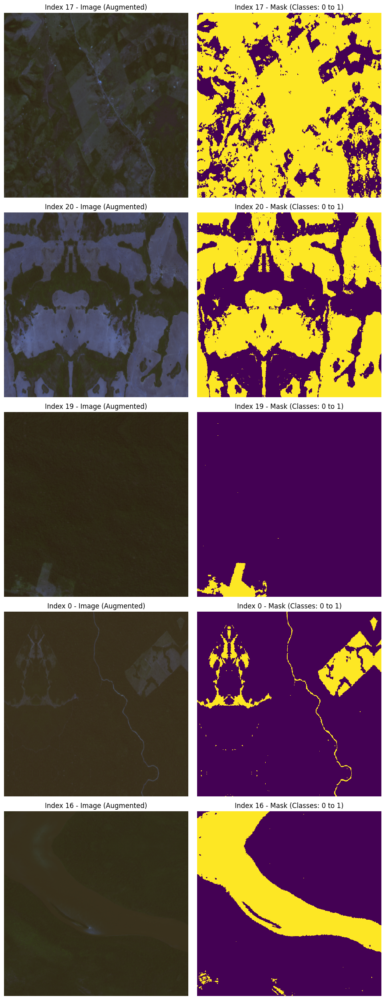

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import random
import torch

def visualize_random_samples(dataset, num_samples=7, rgb_channels=[2, 1, 0]):
    """
    Plots a visual validation of random samples from a geospatial Dataset.

    Ensures the data is correctly loaded, augmented, and permuted before training.

    Args:
        dataset (torch.utils.data.Dataset): The instantiated PyTorch Dataset (e.g., train_ds).
        num_samples (int): Number of random samples to display.
        rgb_channels (list): Indices of channels (R, G, B) to select from the tensor 
                             for the visual composite (e.g., [2, 1, 0] for BGR).
    """
    # 1. Setup Plotting Environment
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, 5 * num_samples))
    
    # Handle the case where the dataset only has 1 sample or fewer than 5
    n_plot = min(num_samples, len(dataset))
    if n_plot == 0:
        print("Dataset is empty.")
        return
        
    if n_plot == 1:
        axes = np.expand_dims(axes, axis=0) # Ensure axes is 2D array for indexing

    # 2. Get Random Indices
    indices = random.sample(range(len(dataset)), n_plot)

    print(f"--- Visual Validation of {n_plot} Samples ---")
    
    # 3. Loop and Plot
    for i, idx in enumerate(indices):
        # Load data (already processed as PyTorch Tensors)
        # Tensors: Image(C, H, W) and Mask(1, H, W)
        image_tensor, mask_tensor = dataset[idx] 

        # --- IMAGE PROCESSING ---
        # Select RGB channels based on the user-defined indices 
        # Permute (C, H, W) -> (H, W, C) for Matplotlib
        img_np = image_tensor[rgb_channels, :, :].permute(1, 2, 0).numpy()
        
        # Clip values to [0, 1] for display. Essential if normalization was used.
        img_np = np.clip(img_np, 0, 1) 

        # --- MASK PROCESSING ---
        # Squeeze channel dim and convert to NumPy (1, H, W) -> (H, W)
        mask_np = mask_tensor.squeeze(0).numpy()
        
        # Image Plot (True-color or False-color composite)
        axes[i, 0].imshow(img_np)
        axes[i, 0].set_title(f"Index {idx} - Image (Augmented)")
        axes[i, 0].axis('off')

        # Mask Plot (Segmentation Map)
        # 'interpolation=none' prevents blurring class boundaries
        axes[i, 1].imshow(mask_np, cmap='viridis', interpolation='none')
        axes[i, 1].set_title(f"Index {idx} - Mask (Classes: {mask_np.min()} to {mask_np.max()})")
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()


# Example Usage: (Assuming you ran the data setup from the previous response)
visualize_random_samples(train_ds, num_samples=5, rgb_channels=[2, 1, 0]) 
# 
# IMPORTANT: Adjust rgb_channels based on your TIFF band order! 
# E.g., if your 4-band TIFF is B, G, R, NIR, use [2, 1, 0] for a True Color composite.

In [12]:
def check_dataset_stats(dataset, num_batches=3):
    """
    Computes statistics (Min, Max, Mean, Std) for a few batches of the dataset.
    Verifies that normalization is correct (e.g., values are within [0, 1]).
    
    Args:
        dataset: PyTorch Dataset
        num_batches: Number of batches to check (to save time vs checking whole dataset)
    """
    loader = DataLoader(dataset, batch_size=4, shuffle=True, num_workers=2)
    
    print(f"--- Checking Dataset Statistics (Scanning {num_batches} batches) ---")
    
    min_val, max_val = float('inf'), float('-inf')
    all_means, all_stds = [], []
    
    for i, (images, masks) in enumerate(loader):
        if i >= num_batches:
            break
            
        # Images are (Batch, C, H, W)
        min_val = min(min_val, images.min().item())
        max_val = max(max_val, images.max().item())
        all_means.append(images.mean().item())
        all_stds.append(images.std().item())
        
        # Check Mask Values (should be integers 0, 1, 2...)
        unique_masks = torch.unique(masks)
        print(f"Batch {i+1}: Image Range [{images.min():.4f}, {images.max():.4f}] | Mask Classes: {unique_masks.tolist()}")

    print(f"\n--- Summary ---")
    print(f"Global Min: {min_val:.4f}")
    print(f"Global Max: {max_val:.4f} (Should be <= 1.0 if normalized)")
    print(f"Avg Mean:   {sum(all_means)/len(all_means):.4f}")
    print(f"Avg Std:    {sum(all_stds)/len(all_stds):.4f}")

    if max_val > 1.0:
        print("\n⚠️ WARNING: Max value > 1.0. Your normalization might be missing or incorrect for this bit-depth.")
    else:
        print("\n✅ SUCCESS: Data is properly normalized to [0, 1] range.")

# Usage
check_dataset_stats(train_ds,4)

--- Checking Dataset Statistics (Scanning 4 batches) ---
Batch 1: Image Range [0.0615, 0.6280] | Mask Classes: [0, 1]
Batch 2: Image Range [0.0789, 0.9962] | Mask Classes: [0, 1]
Batch 3: Image Range [0.0755, 0.8260] | Mask Classes: [0, 1]
Batch 4: Image Range [0.0618, 0.9216] | Mask Classes: [0, 1]

--- Summary ---
Global Min: 0.0615
Global Max: 0.9962 (Should be <= 1.0 if normalized)
Avg Mean:   0.2084
Avg Std:    0.0730

✅ SUCCESS: Data is properly normalized to [0, 1] range.


### 4-band Amazon

In [13]:
def get_4band_transforms(split="train", img_size=512):
    transforms_list = [
        # Resize inputs to ensure standard shape
        A.Resize(height=img_size, width=img_size, interpolation=cv2.INTER_LINEAR),
    ]
    
    if split == "train":
        transforms_list.extend([
            # --- GEOMETRIC ONLY (Safe for 4-Band) ---
            # using border_mode=cv2.BORDER_REFLECT_101 (4) to fix black borders
            A.Rotate(limit=180, border_mode=cv2.BORDER_REFLECT_101, p=0.7),
            
            A.ShiftScaleRotate(
                shift_limit=0.25, 
                scale_limit=0.25, 
                rotate_limit=0, 
                border_mode=cv2.BORDER_REFLECT_101, 
                p=0.7
            ),
            
            A.Affine(shear=(-14, 14), border_mode=cv2.BORDER_REFLECT_101, p=0.5),
            A.HorizontalFlip(p=0.7),
            A.VerticalFlip(p=0.7),
            
        ])
    
    transforms_list.append(ToTensorV2())
    return A.Compose(transforms_list)


class FourBandAmazonDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # A. Load 4-Band Image
        with rasterio.open(self.image_paths[idx]) as src:
            # Read all 4 bands
            # Shape: (4, H, W) -> Transpose to (H, W, 4) for Albumentations
            image = src.read().transpose(1, 2, 0).astype(np.float32)

            # --- NORMALIZATION (Matches your old code) ---
            # Formula: (img - min) / (max - min)
            # Added 1e-8 epsilon to prevent "Divide by Zero" on empty black images
            img_min = image.min()
            img_max = image.max()
            image = (image - img_min) / (img_max - img_min + 1e-8)

        # B. Load Mask
        with rasterio.open(self.mask_paths[idx]) as src:
            mask = src.read(1) # Read 1st band
            # Assuming mask is already 0, 1, 2... if not, subtract 1 like before
            # Based on your old code "rxr.open_rasterio", it seems values are raw
            mask = mask.astype(np.float32)

        # --- FIX: Match Dimensions (The "Bouncer" Logic) ---
        h, w = image.shape[:2]
        mh, mw = mask.shape[:2]
        
        if mh != h or mw != w:
            # Crop mask to match image
            mask = mask[:h, :w]
            # (Optional: Add padding logic here if mask is smaller)

        # C. Apply Transforms
        if self.transform:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"]

        # D. Final Formatting
        if not isinstance(mask, torch.Tensor):
            mask = torch.from_numpy(mask)
        
        # CrossEntropy expects (H, W), Dice expects (1, H, W)
        # We'll use (H, W) standard for now
        mask = mask.long()

        return image, mask


base_dir2 = r"./AMAZON/"

def get_4band_files(base_dir, split="Training"):
    # Define folder names based on the split (handling the inconsistency)
    if split == "Training":
        img_folder, mask_folder = "image", "label"
    elif split == "Test":
        img_folder, mask_folder = "image", "mask"
    elif split == "Validation":
        img_folder, mask_folder = "images", "masks"
        
    # Get Paths
    img_path = os.path.join(base_dir, split, img_folder)
    mask_path = os.path.join(base_dir, split, mask_folder)
    
    # Get List
    image_files = sorted(glob.glob(os.path.join(img_path, "*")))
    
    # Match masks (Assuming same filename)
    mask_files = []
    for img in image_files:
        filename = os.path.basename(img)
        mask_files.append(os.path.join(mask_path, filename))
        
    return image_files, mask_files

# --- LOAD DATA ---
# 1. Get Lists
train_imgs, train_masks = get_4band_files(base_dir2, "Training")
val_imgs, val_masks = get_4band_files(base_dir2, "Validation")

# 2. Create Datasets (Don't forget the transform!)
train_ds_4band = FourBandAmazonDataset(
    train_imgs, 
    train_masks, 
    transform=get_4band_transforms("train")
)

val_ds_4band = FourBandAmazonDataset(
    val_imgs, 
    val_masks, 
    transform=get_4band_transforms("val")
)

# 3. DataLoaders
train_loader_4band = DataLoader(train_ds_4band, batch_size=2, shuffle=True, num_workers=2)
val_loader_4band = DataLoader(val_ds_4band, batch_size=2, shuffle=False, num_workers=2)

print("✅ 4-Band Pipeline Ready")    

✅ 4-Band Pipeline Ready


VISUALIZING TRAINING DATA (Should show rotation/flips/reflection):
--- Visualizing 3 Samples from 4-Band Dataset ---


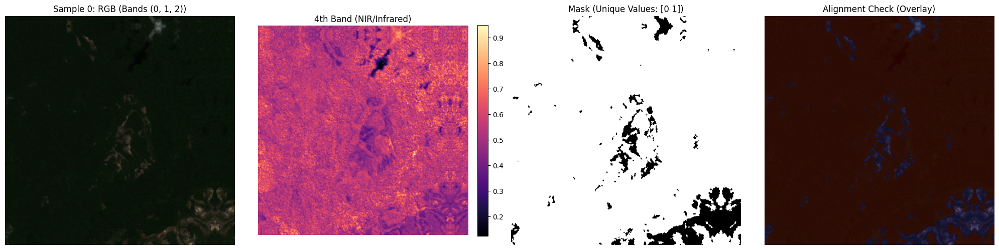

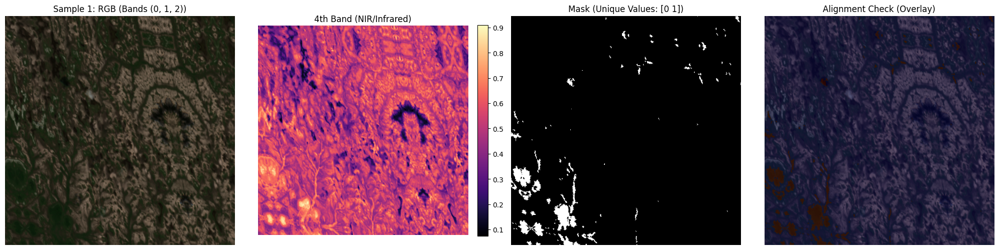

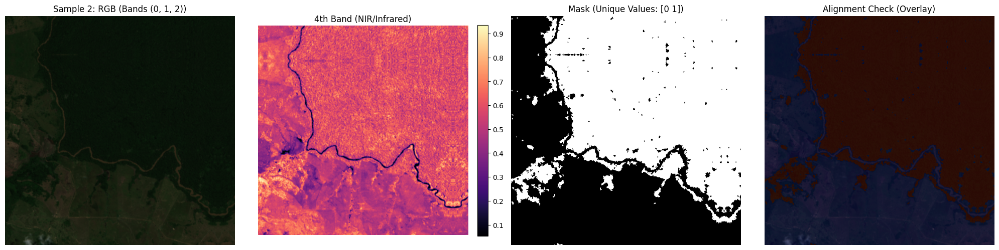


VISUALIZING VALIDATION DATA (Should be standard):
--- Visualizing 2 Samples from 4-Band Dataset ---


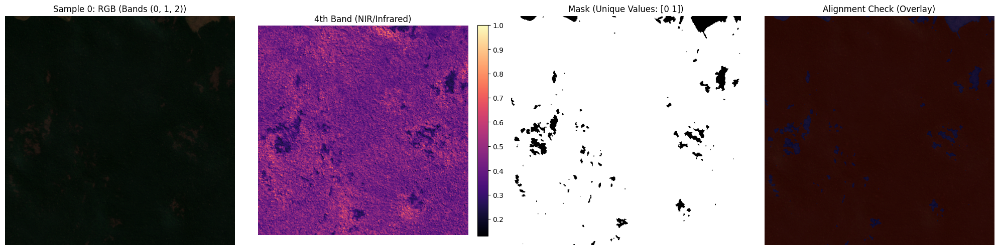

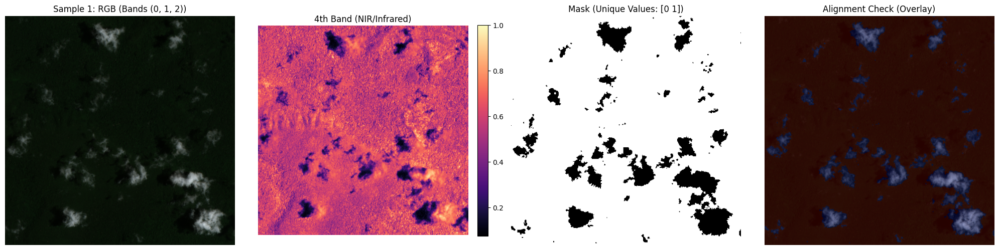

In [14]:

def visualize_4band_dataset(dataset, num_samples=3, band_order=(0, 1, 2)):
    """
    Visualizes 4-band imagery by splitting it into RGB and the 4th Band (NIR).
    
    Args:
        dataset: Your PyTorch dataset (FourBandAmazonDataset)
        num_samples: How many images to show
        band_order: Indices of (Red, Green, Blue) bands. 
                    Default (0,1,2) assumes the Tiff is saved as R-G-B-NIR.
    """
    
    # Create a small loader to get a batch
    # We use batch_size=1 just to grab samples easily
    loader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)
    
    print(f"--- Visualizing {num_samples} Samples from 4-Band Dataset ---")
    
    for i, (image, mask) in enumerate(loader):
        if i >= num_samples:
            break
            
        # 1. Unpack Tensor: (1, 4, H, W) -> (4, H, W)
        img_tensor = image.squeeze(0)
        mask_tensor = mask.squeeze(0)
        
        # 2. Extract RGB Channels for display
        # We assume the image is already normalized 0-1 by your Dataset class
        r_band = img_tensor[band_order[0], :, :].numpy()
        g_band = img_tensor[band_order[1], :, :].numpy()
        b_band = img_tensor[band_order[2], :, :].numpy()
        
        # Stack them to create a standard RGB image for Matplotlib
        rgb_img = np.stack([r_band, g_band, b_band], axis=-1)
        
        # 3. Extract the 4th Band (Usually NIR - Near Infrared)
        # We assume it is at index 3 (the last one)
        nir_band = img_tensor[3, :, :].numpy()
        
        # 4. Process Mask (Remove extra dims)
        mask_img = mask_tensor.squeeze().numpy()

        # --- PLOTTING ---
        fig, ax = plt.subplots(1, 4, figsize=(20, 5))
        
        # A. RGB Composition
        ax[0].imshow(rgb_img)
        ax[0].set_title(f"Sample {i}: RGB (Bands {band_order})")
        ax[0].axis('off')
        
        # B. 4th Band (Heatmap style)
        # We use a colormap to see the signal intensity clearly
        im_nir = ax[1].imshow(nir_band, cmap='magma')
        ax[1].set_title("4th Band (NIR/Infrared)")
        ax[1].axis('off')
        plt.colorbar(im_nir, ax=ax[1], fraction=0.046, pad=0.04)
        
        # C. Ground Truth Mask
        ax[2].imshow(mask_img, cmap='gray')
        ax[2].set_title(f"Mask (Unique Values: {np.unique(mask_img)})")
        ax[2].axis('off')
        
        # D. Overlay (Check Alignment)
        # We plot the mask ON TOP of the RGB image with transparency (alpha)
        ax[3].imshow(rgb_img)
        ax[3].imshow(mask_img, cmap='jet', alpha=0.3) # 30% transparent mask
        ax[3].set_title("Alignment Check (Overlay)")
        ax[3].axis('off')
        
        plt.tight_layout()
        plt.show()

# --- RUN IT ---
# Try checking both Training (Augmented) and Validation (Raw)
print("VISUALIZING TRAINING DATA (Should show rotation/flips/reflection):")
visualize_4band_dataset(train_ds_4band, num_samples=3)

print("\nVISUALIZING VALIDATION DATA (Should be standard):")
visualize_4band_dataset(val_ds_4band, num_samples=2)

### 4-band Atlantic Forest

In [15]:
base_dir3 = r"./ATLANTIC FOREST/"

train_imgs3, train_masks3 = get_4band_files(base_dir3, "Training")
val_imgs3, val_masks3 = get_4band_files(base_dir3, "Validation")

# 2. Create Datasets (Don't forget the transform!)
train_ds_4band_2 = FourBandAmazonDataset(
    train_imgs3, 
    train_masks3, 
    transform=get_4band_transforms("train")
)

val_ds_4band_2 = FourBandAmazonDataset(
    val_imgs3, 
    val_masks3, 
    transform=get_4band_transforms("val")
)

# 3. DataLoaders
train_loader_4band_2 = DataLoader(train_ds_4band_2, batch_size=2, shuffle=True, num_workers=2)
val_loader_4band_2 = DataLoader(val_ds_4band_2, batch_size=2, shuffle=False, num_workers=2)

print("✅ 4-Band Pipeline Ready")    

✅ 4-Band Pipeline Ready


VISUALIZING TRAINING DATA (Should show rotation/flips/reflection):
--- Visualizing 3 Samples from 4-Band Dataset ---


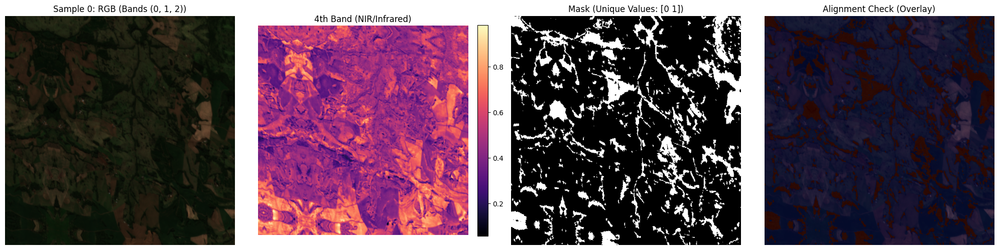

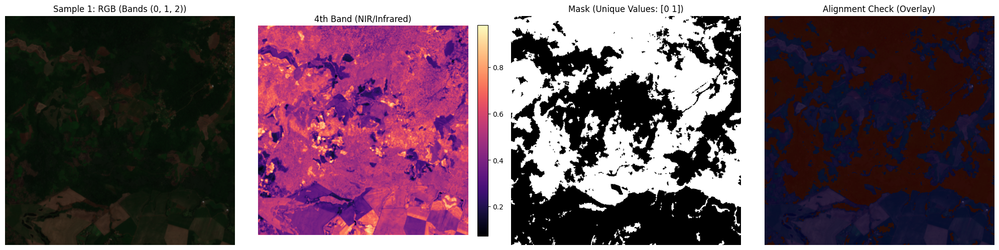

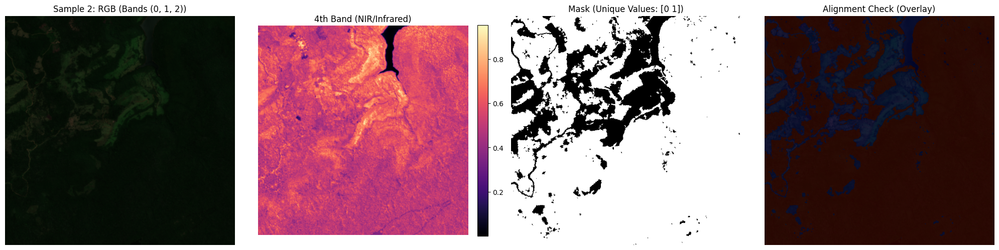


VISUALIZING VALIDATION DATA (Should be standard):
--- Visualizing 2 Samples from 4-Band Dataset ---


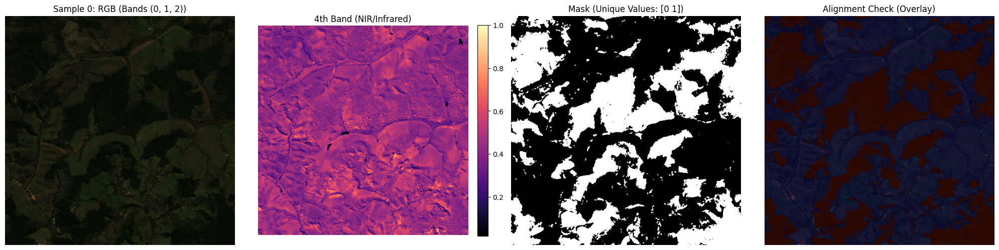

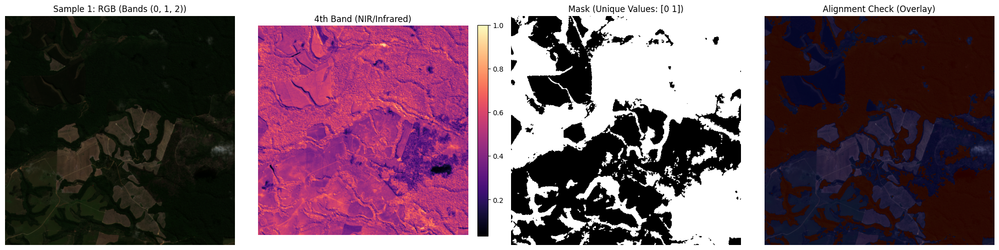

In [16]:
# --- RUN IT ---
# Try checking both Training (Augmented) and Validation (Raw)
print("VISUALIZING TRAINING DATA (Should show rotation/flips/reflection):")
visualize_4band_dataset(train_ds_4band_2, num_samples=3)

print("\nVISUALIZING VALIDATION DATA (Should be standard):")
visualize_4band_dataset(val_ds_4band_2, num_samples=2)

## Training

Train all 5 models on all 3 datasets (15 total training runs).

Training configuration matches TensorFlow notebook exactly:
- Batch size: 1
- Steps per epoch: 100
- Loss: Binary Cross Entropy
- Metrics: Accuracy, MSE
- Checkpointing: Save best model based on validation accuracy

In [25]:
# Training Configuration

# Create directories for saving models and figures
os.makedirs('models_pytorch', exist_ok=True)
os.makedirs('figures_pytorch', exist_ok=True)
os.makedirs('metrics_pytorch', exist_ok=True)

# Loss function
#criterion = nn.BCELoss()
criterion = nn.BCEWithLogitsLoss()

print("Setup complete. Ready for training.")

Setup complete. Ready for training.


### Train U-Net on RGB Data

Training U-Net on RGB data...



/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 1/30:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356


Epoch 1: val_accuracy improved to 0.8753, saving model to models_pytorch/unet-3d.pth
Epoch 1/30 - loss: 0.4312 - acc: 0.7894 - mse: 0.1392 - val_loss: 0.3167 - val_acc: 0.8753 - val_mse: 0.0967


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 2/30:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356


Epoch 2: val_accuracy improved to 0.9029, saving model to models_pytorch/unet-3d.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 3/30:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356


Epoch 3: val_accuracy improved to 0.9275, saving model to models_pytorch/unet-3d.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 4/30:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356

Epoch 6/30 - loss: 0.2070 - acc: 0.9205 - mse: 0.0596 - val_loss: 0.2788 - val_acc: 0.8862 - val_mse: 0.0849


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 7/30:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356


Epoch 8: val_accuracy improved to 0.9287, saving model to models_pytorch/unet-3d.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 9/30:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356

Epoch 11/30 - loss: 0.1607 - acc: 0.9396 - mse: 0.0453 - val_loss: 0.1966 - val_acc: 0.9287 - val_mse: 0.0549


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 12/30:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 12: val_accuracy improved to 0.9347, saving model to models_pytorch/unet-3d.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 13/30:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

Epoch 16/30 - loss: 0.1836 - acc: 0.9311 - mse: 0.0519 - val_loss: 0.2301 - val_acc: 0.9136 - val_mse: 0.0659


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 17/30:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 17: val_accuracy improved to 0.9372, saving model to models_pytorch/unet-3d.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 18/30:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 18: val_accuracy improved to 0.9452, saving model to models_pytorch/unet-3d.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 19/30:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

Epoch 21/30 - loss: 0.1622 - acc: 0.9388 - mse: 0.0461 - val_loss: 0.1686 - val_acc: 0.9391 - val_mse: 0.0480


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 22/30:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

Epoch 26/30 - loss: 0.1631 - acc: 0.9393 - mse: 0.0456 - val_loss: 0.1681 - val_acc: 0.9389 - val_mse: 0.0477


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 27/30:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 28: val_accuracy improved to 0.9525, saving model to models_pytorch/unet-3d.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 29/30:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

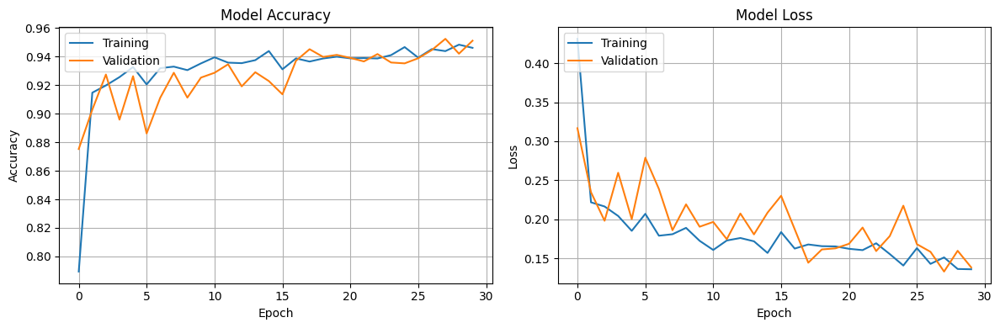

In [18]:
# U-Net on RGB (3-channel)

print("Training U-Net on RGB data...\n")

model_unet_rgb = UNet(in_channels=3, out_channels=1).to(device)
optimizer_unet_rgb = torch.optim.Adam(model_unet_rgb.parameters(), lr=0.0001,
                                      betas=(0.9, 0.999), eps=1e-7)

history_unet_rgb = train_model(
    model_unet_rgb,
    train_loader,
    val_loader,
    criterion,
    optimizer_unet_rgb,
    num_epochs=30,
    steps_per_epoch=100,
    device=device,
    save_path='models_pytorch/unet-3d.pth',
    verbose=1
)

# Save history
np.save('models_pytorch/unet-3d-history.npy', history_unet_rgb)

# Plot training curves
plot_training_history(history_unet_rgb, save_path='figures_pytorch/unet-3d-history.png')

### Train Attention U-Net on RGB Data

Training Attention U-Net on RGB data...



Epoch 1/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356


Epoch 1: val_accuracy improved to 0.7255, saving model to models_pytorch/attention-unet-3d_v2.pth
Epoch 1/50 - loss: 0.4221 - acc: 0.8060 - mse: 0.1358 - val_loss: 0.4870 - val_acc: 0.7255 - val_mse: 0.1711


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 2/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356


Epoch 2: val_accuracy improved to 0.9114, saving model to models_pytorch/attention-unet-3d_v2.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 3/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356


Epoch 4: val_accuracy improved to 0.9180, saving model to models_pytorch/attention-unet-3d_v2.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 5/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356

Epoch 6/50 - loss: 0.2338 - acc: 0.9227 - mse: 0.0605 - val_loss: 0.4976 - val_acc: 0.8014 - val_mse: 0.1536


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 7/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356


Epoch 9: val_accuracy improved to 0.9194, saving model to models_pytorch/attention-unet-3d_v2.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 10/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 11: val_accuracy improved to 0.9206, saving model to models_pytorch/attention-unet-3d_v2.pth
Epoch 11/50 - loss: 0.1918 - acc: 0.9290 - mse: 0.0540 - val_loss: 0.2130 - val_acc: 0.9206 - val_mse: 0.0624


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 12/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

Epoch 16/50 - loss: 0.2039 - acc: 0.9241 - mse: 0.0578 - val_loss: 0.2819 - val_acc: 0.8973 - val_mse: 0.0803


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 17/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 17: val_accuracy improved to 0.9215, saving model to models_pytorch/attention-unet-3d_v2.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 18/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 20: val_accuracy improved to 0.9229, saving model to models_pytorch/attention-unet-3d_v2.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 21/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

Epoch 21/50 - loss: 0.1868 - acc: 0.9294 - mse: 0.0530 - val_loss: 0.2171 - val_acc: 0.9149 - val_mse: 0.0639


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 22/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 23: val_accuracy improved to 0.9232, saving model to models_pytorch/attention-unet-3d_v2.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 24/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 24: val_accuracy improved to 0.9246, saving model to models_pytorch/attention-unet-3d_v2.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 25/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 25: val_accuracy improved to 0.9249, saving model to models_pytorch/attention-unet-3d_v2.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 26/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

Epoch 26/50 - loss: 0.1766 - acc: 0.9314 - mse: 0.0512 - val_loss: 0.2233 - val_acc: 0.9159 - val_mse: 0.0637


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 27/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 27: val_accuracy improved to 0.9256, saving model to models_pytorch/attention-unet-3d_v2.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 28/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

Epoch 31/50 - loss: 0.1938 - acc: 0.9260 - mse: 0.0555 - val_loss: 0.2319 - val_acc: 0.9098 - val_mse: 0.0679


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 32/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

Epoch 36/50 - loss: 0.1780 - acc: 0.9318 - mse: 0.0506 - val_loss: 0.2250 - val_acc: 0.9165 - val_mse: 0.0640


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 37/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 41: val_accuracy improved to 0.9303, saving model to models_pytorch/attention-unet-3d_v2.pth
Epoch 41/50 - loss: 0.1654 - acc: 0.9377 - mse: 0.0471 - val_loss: 0.1858 - val_acc: 0.9303 - val_mse: 0.0532


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 42/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 45: val_accuracy improved to 0.9313, saving model to models_pytorch/attention-unet-3d_v2.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 46/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

Epoch 46/50 - loss: 0.1688 - acc: 0.9353 - mse: 0.0484 - val_loss: 0.1923 - val_acc: 0.9300 - val_mse: 0.0550


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 47/50:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

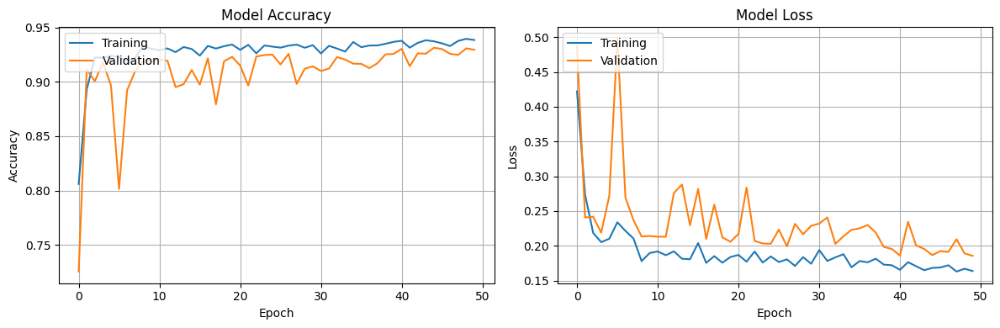

In [36]:
# Attention U-Net on RGB (3-channel)

print("Training Attention U-Net on RGB data...\n")

model_attn_unet_rgb = AttentionUNet(in_channels=3, out_channels=1, filter_base=16).to(device)
optimizer_attn_unet_rgb = torch.optim.Adam(model_attn_unet_rgb.parameters(), lr=0.0005,
                                           betas=(0.9, 0.999), eps=1e-7)

# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
#     optimizer_attn_unet_rgb, mode='min', factor=0.1, patience=5, verbose=True
# )                                           

history_attn_unet_rgb = train_model(
    model_attn_unet_rgb,
    train_loader,
    val_loader,
    criterion,
    optimizer_attn_unet_rgb,
    num_epochs=50,
    steps_per_epoch=100,
    device=device,
    save_path='models_pytorch/attention-unet-3d_v2.pth',
    verbose=1
)

# Save history
np.save('models_pytorch/attention-unet-3d-history_v2.npy', history_attn_unet_rgb)

# Plot training curves
plot_training_history(history_attn_unet_rgb,
                     save_path='figures_pytorch/attention-unet-3d-history_v2.png')

### ResUNet on RGB

Training Attention U-Net on RGB data...



Epoch 1/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356


Epoch 1: val_accuracy improved to 0.8317, saving model to models_pytorch/resunet-3d.pth
Epoch 1/40 - loss: 13.3588 - acc: 0.7263 - mse: 0.2536 - val_loss: 0.7126 - val_acc: 0.8317 - val_mse: 0.1440


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 2/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356


Epoch 2: val_accuracy improved to 0.8449, saving model to models_pytorch/resunet-3d.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 3/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356


Epoch 4: val_accuracy improved to 0.8507, saving model to models_pytorch/resunet-3d.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 5/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356


Epoch 5: val_accuracy improved to 0.8559, saving model to models_pytorch/resunet-3d.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 6/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356

Epoch 6/40 - loss: 0.2725 - acc: 0.8934 - mse: 0.0804 - val_loss: 0.4059 - val_acc: 0.8392 - val_mse: 0.1233


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 7/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356


Epoch 7: val_accuracy improved to 0.8622, saving model to models_pytorch/resunet-3d.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 8/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356

Epoch 11/40 - loss: 0.2806 - acc: 0.8892 - mse: 0.0828 - val_loss: 0.4717 - val_acc: 0.7975 - val_mse: 0.1396


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 12/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 15: val_accuracy improved to 0.8647, saving model to models_pytorch/resunet-3d.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 16/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

Epoch 16/40 - loss: 0.2479 - acc: 0.9000 - mse: 0.0734 - val_loss: 0.3327 - val_acc: 0.8641 - val_mse: 0.1030


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 17/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

Epoch 21/40 - loss: 0.2112 - acc: 0.9161 - mse: 0.0631 - val_loss: 0.6447 - val_acc: 0.8311 - val_mse: 0.1439


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 22/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 25: val_accuracy improved to 0.8674, saving model to models_pytorch/resunet-3d.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 26/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 26: val_accuracy improved to 0.8805, saving model to models_pytorch/resunet-3d.pth
Epoch 26/40 - loss: 0.2192 - acc: 0.9163 - mse: 0.0649 - val_loss: 0.2988 - val_acc: 0.8805 - val_mse: 0.0932


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 27/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 28: val_accuracy improved to 0.8857, saving model to models_pytorch/resunet-3d.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 29/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35


Epoch 30: val_accuracy improved to 0.8936, saving model to models_pytorch/resunet-3d.pth


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 31/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

Epoch 31/40 - loss: 0.2026 - acc: 0.9208 - mse: 0.0602 - val_loss: 0.2776 - val_acc: 0.8809 - val_mse: 0.0856


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 32/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

Epoch 36/40 - loss: 0.2069 - acc: 0.9249 - mse: 0.0598 - val_loss: 0.2920 - val_acc: 0.8802 - val_mse: 0.0914


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
Epoch 37/40:   0%|          | 0/100 [00:00<?, ?it/s]/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/rasterio/__init__.py:35

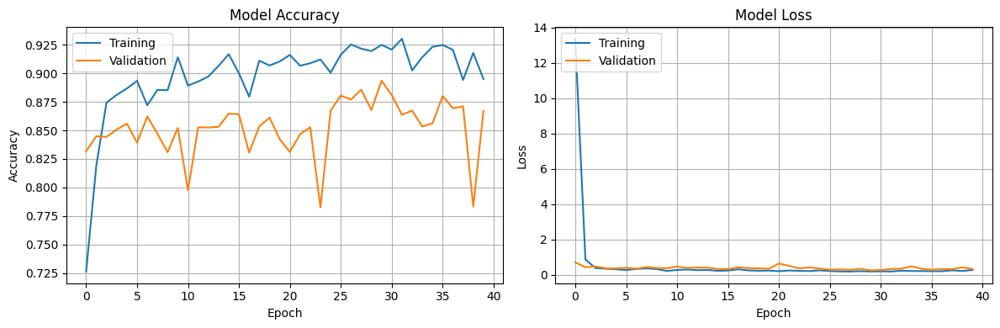

In [25]:
# Attention U-Net on RGB (3-channel)

print("Training Attention U-Net on RGB data...\n")

model_resunet_rgb = ResUNet(in_channels=3, out_channels=1).to(device)
optimizer_resunet_rgb = torch.optim.Adam(model_resunet_rgb.parameters(), lr=0.0001,
                                           betas=(0.9, 0.999), eps=1e-7)

history_resunet_rgb = train_model(
    model_resunet_rgb,
    train_loader,
    val_loader,
    criterion,
    optimizer_resunet_rgb,
    num_epochs=40,
    steps_per_epoch=100,
    device=device,
    save_path='models_pytorch/resunet-3d.pth',
    verbose=1
)

# Save history
np.save('models_pytorch/resunet-3d-history.npy', history_resunet_rgb)

# Plot training curves
plot_training_history(history_resunet_rgb,
                     save_path='figures_pytorch/resunet-3d-history.png')

### U-Net on 4-band datasets

In [44]:
# U-Net on RGB (3-channel)

print("Training U-Net on RGB data...\n")

model_unet_4band = UNet(in_channels=4, out_channels=1).to(device)
optimizer_unet_4band = torch.optim.Adam(model_unet_4band.parameters(), lr=0.0001,
                                      betas=(0.9, 0.999), eps=1e-7)

history_unet_4band = train_model(
    model_unet_4band,
    train_loader_4band,
    val_loader_4band,
    criterion,
    optimizer_unet_4band,
    num_epochs=20,
    steps_per_epoch=100,
    device=device,
    save_path='models_pytorch/unet-4band.pth',
    verbose=1
)

# Save history
np.save('models_pytorch/unet-4band-history.npy', history_unet_4band)

# Plot training curves
plot_training_history(history_unet_4band, save_path='figures_pytorch/unet-4band-history.png')

Training U-Net on RGB data...



Epoch 1/20: 100%|██████████| 100/100 [05:28<00:00,  3.28s/it, loss=0.6112, acc=0.7227]



Epoch 1: val_accuracy improved to 0.9157, saving model to models_pytorch/unet-4band.pth
Epoch 1/20 - loss: 0.3656 - acc: 0.8376 - mse: 0.1142 - val_loss: 0.2224 - val_acc: 0.9157 - val_mse: 0.0644


Epoch 2/20: 100%|██████████| 100/100 [05:45<00:00,  3.45s/it, loss=0.2221, acc=0.9171]



Epoch 2: val_accuracy improved to 0.9295, saving model to models_pytorch/unet-4band.pth


Epoch 3/20:  75%|███████▌  | 75/100 [04:23<01:27,  3.52s/it, loss=0.4173, acc=0.8193]


KeyboardInterrupt: 

### Attention U-Net on 4-band datasets

Training Attention U-Net on RGB data...



Epoch 1/20: 100%|██████████| 100/100 [00:09<00:00, 11.06it/s, loss=0.1553, acc=0.9445]



Epoch 1: val_accuracy improved to 0.8958, saving model to models_pytorch/attention-unet-4d.pth
Epoch 1/20 - loss: 0.3915 - acc: 0.8550 - mse: 0.1238 - val_loss: 0.2683 - val_acc: 0.8958 - val_mse: 0.0786


Epoch 2/20: 100%|██████████| 100/100 [00:10<00:00,  9.66it/s, loss=0.0870, acc=0.9688]



Epoch 2: val_accuracy improved to 0.9209, saving model to models_pytorch/attention-unet-4d.pth


Epoch 4/20: 100%|██████████| 100/100 [00:09<00:00, 11.07it/s, loss=0.2134, acc=0.9089]



Epoch 4: val_accuracy improved to 0.9463, saving model to models_pytorch/attention-unet-4d.pth


Epoch 5/20: 100%|██████████| 100/100 [00:10<00:00,  9.64it/s, loss=0.1184, acc=0.9567]



Epoch 5: val_accuracy improved to 0.9522, saving model to models_pytorch/attention-unet-4d.pth


Epoch 6/20: 100%|██████████| 100/100 [00:09<00:00, 10.90it/s, loss=0.0872, acc=0.9665]



Epoch 6: val_accuracy improved to 0.9617, saving model to models_pytorch/attention-unet-4d.pth
Epoch 6/20 - loss: 0.1439 - acc: 0.9447 - mse: 0.0415 - val_loss: 0.0992 - val_acc: 0.9617 - val_mse: 0.0284


Epoch 10/20: 100%|██████████| 100/100 [00:08<00:00, 11.18it/s, loss=0.0954, acc=0.9683]



Epoch 10: val_accuracy improved to 0.9664, saving model to models_pytorch/attention-unet-4d.pth


Epoch 11/20: 100%|██████████| 100/100 [00:10<00:00,  9.70it/s, loss=0.0892, acc=0.9643]



Epoch 11: val_accuracy improved to 0.9703, saving model to models_pytorch/attention-unet-4d.pth
Epoch 11/20 - loss: 0.0988 - acc: 0.9611 - mse: 0.0288 - val_loss: 0.0760 - val_acc: 0.9703 - val_mse: 0.0220


Epoch 15/20: 100%|██████████| 100/100 [00:08<00:00, 11.15it/s, loss=0.0686, acc=0.9739]



Epoch 15: val_accuracy improved to 0.9709, saving model to models_pytorch/attention-unet-4d.pth


Epoch 16/20: 100%|██████████| 100/100 [00:09<00:00, 10.93it/s, loss=0.0233, acc=0.9914]



Epoch 16: val_accuracy improved to 0.9732, saving model to models_pytorch/attention-unet-4d.pth
Epoch 16/20 - loss: 0.0904 - acc: 0.9643 - mse: 0.0263 - val_loss: 0.0690 - val_acc: 0.9732 - val_mse: 0.0198


Epoch 17/20: 100%|██████████| 100/100 [00:10<00:00,  9.79it/s, loss=0.0689, acc=0.9734]



Epoch 17: val_accuracy improved to 0.9733, saving model to models_pytorch/attention-unet-4d.pth


Epoch 19/20: 100%|██████████| 100/100 [00:08<00:00, 11.13it/s, loss=0.0863, acc=0.9646]



Epoch 19: val_accuracy improved to 0.9741, saving model to models_pytorch/attention-unet-4d.pth


Epoch 20/20: 100%|██████████| 100/100 [00:08<00:00, 11.30it/s, loss=0.1527, acc=0.9396]


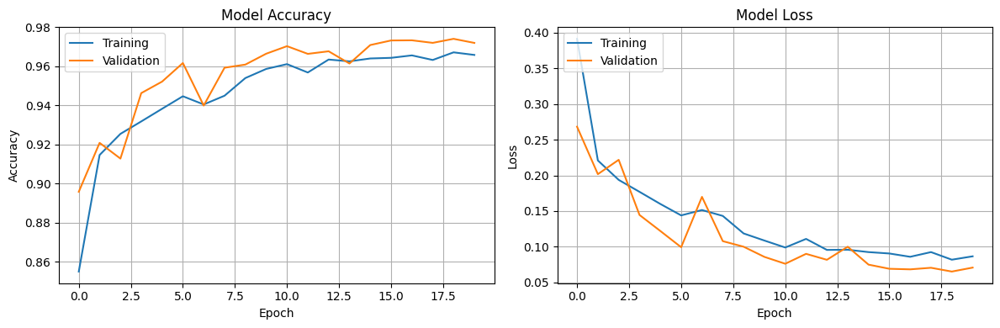

In [ ]:
# Attention U-Net on RGB (3-channel)

print("Training Attention U-Net on RGB data...\n")

model_attn_unet_4band = AttentionUNet(in_channels=4, out_channels=1, filter_base=16).to(device)
optimizer_attn_unet_4band = torch.optim.Adam(model_attn_unet_4band.parameters(), lr=0.0005,
                                           betas=(0.9, 0.999), eps=1e-7)

# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
#     optimizer_attn_unet_4band, mode='min', factor=0.1, patience=5, verbose=True
# )                                           

history_attn_unet_4band = train_model(
    model_attn_unet_4band,
    train_loader_4band,
    val_loader_4band,
    criterion,
    optimizer_attn_unet_4band,
    num_epochs=60,
    steps_per_epoch=100,
    device=device,
    save_path='models_pytorch/attention-unet-4d.pth',
    verbose=1
)

# Save history
np.save('models_pytorch/attention-unet-4d-history.npy', history_attn_unet_4band)

# Plot training curves
plot_training_history(history_attn_unet_4band,
                     save_path='figures_pytorch/attention-unet-4d-history.png')

### ResuNet on 4-band dataset   


Training Attention U-Net on RGB data...



Epoch 1/20: 100%|██████████| 100/100 [00:33<00:00,  2.98it/s, loss=0.1443, acc=0.9486]



Epoch 1: val_accuracy improved to 0.9171, saving model to models_pytorch/resunet-4d-2.pth
Epoch 1/20 - loss: 8.1649 - acc: 0.7378 - mse: 0.2390 - val_loss: 0.2102 - val_acc: 0.9171 - val_mse: 0.0617


Epoch 2/20: 100%|██████████| 100/100 [00:32<00:00,  3.05it/s, loss=0.1653, acc=0.9314]



Epoch 2: val_accuracy improved to 0.9225, saving model to models_pytorch/resunet-4d-2.pth


Epoch 5/20: 100%|██████████| 100/100 [00:32<00:00,  3.04it/s, loss=0.0379, acc=0.9844]



Epoch 5: val_accuracy improved to 0.9383, saving model to models_pytorch/resunet-4d-2.pth


Epoch 6/20: 100%|██████████| 100/100 [00:33<00:00,  3.02it/s, loss=0.1428, acc=0.9515]



Epoch 6: val_accuracy improved to 0.9415, saving model to models_pytorch/resunet-4d-2.pth
Epoch 6/20 - loss: 0.2153 - acc: 0.9247 - mse: 0.0585 - val_loss: 0.1521 - val_acc: 0.9415 - val_mse: 0.0439


Epoch 7/20: 100%|██████████| 100/100 [00:32<00:00,  3.04it/s, loss=0.1090, acc=0.9611]



Epoch 7: val_accuracy improved to 0.9455, saving model to models_pytorch/resunet-4d-2.pth


Epoch 10/20: 100%|██████████| 100/100 [00:32<00:00,  3.05it/s, loss=0.2296, acc=0.9015]



Epoch 10: val_accuracy improved to 0.9561, saving model to models_pytorch/resunet-4d-2.pth


Epoch 11/20: 100%|██████████| 100/100 [00:32<00:00,  3.04it/s, loss=0.1085, acc=0.9553]


Epoch 11/20 - loss: 0.1781 - acc: 0.9346 - mse: 0.0493 - val_loss: 0.1282 - val_acc: 0.9495 - val_mse: 0.0375


Epoch 12/20: 100%|██████████| 100/100 [00:32<00:00,  3.03it/s, loss=0.1833, acc=0.9315]



Epoch 12: val_accuracy improved to 0.9594, saving model to models_pytorch/resunet-4d-2.pth


Epoch 15/20: 100%|██████████| 100/100 [00:33<00:00,  3.02it/s, loss=0.0572, acc=0.9843]



Epoch 15: val_accuracy improved to 0.9618, saving model to models_pytorch/resunet-4d-2.pth


Epoch 16/20: 100%|██████████| 100/100 [00:33<00:00,  3.01it/s, loss=0.0647, acc=0.9739]


Epoch 16/20 - loss: 0.1271 - acc: 0.9516 - mse: 0.0363 - val_loss: 0.1054 - val_acc: 0.9581 - val_mse: 0.0309


Epoch 17/20: 100%|██████████| 100/100 [00:33<00:00,  3.03it/s, loss=0.1085, acc=0.9553]



Epoch 17: val_accuracy improved to 0.9620, saving model to models_pytorch/resunet-4d-2.pth


Epoch 20/20: 100%|██████████| 100/100 [00:33<00:00,  3.02it/s, loss=0.0515, acc=0.9782]


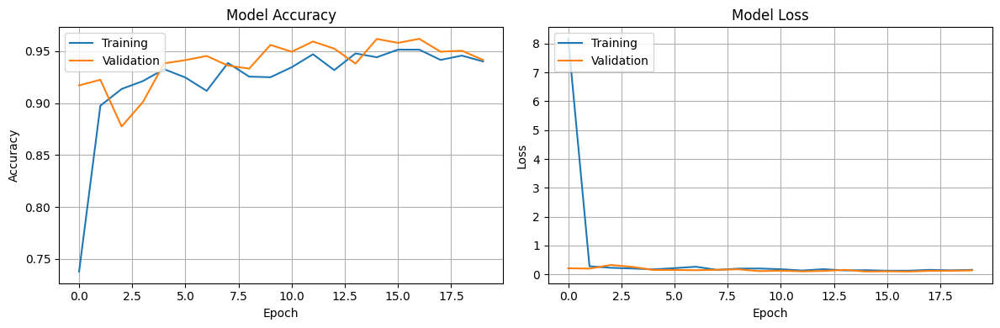

In [18]:
# Attention U-Net on RGB (3-channel)

print("Training Attention U-Net on RGB data...\n")

model_resunet_4band = ResUNet(in_channels=4, out_channels=1).to(device)
optimizer_resunet_4band = torch.optim.Adam(model_resunet_4band.parameters(), lr=0.0001,
                                           betas=(0.9, 0.999), eps=1e-7)

history_resunet_4band = train_model(
    model_resunet_4band,
    train_loader_4band,
    val_loader_4band,
    criterion,
    optimizer_resunet_4band,
    num_epochs=20,
    steps_per_epoch=100,
    device=device,
    save_path='models_pytorch/resunet-4d-2.pth',
    verbose=1
)

# Save history
np.save('models_pytorch/resunet-4d-history.npy', history_resunet_4band)

# Plot training curves
plot_training_history(history_resunet_4band,
                     save_path='figures_pytorch/resunet-4d-2-history.png')

### ResNet 4-band dataset

In [ ]:
model_resnet_4band = KerasSegNetReplicated(in_channels=4, n_classes=1).to(device)
optimizer_resnet_4band = torch.optim.Adam(model_resnet_4band.parameters(), lr=0.0001,
                                           betas=(0.9, 0.999), eps=1e-7)

history_resnet_4band = train_model(
    model_resnet_4band,
    train_loader_4band,
    val_loader_4band,
    criterion,
    optimizer_resnet_4band,
    num_epochs=20,
    steps_per_epoch=100,
    device=device,
    save_path='models_pytorch/resnet-4d.pth',
    verbose=1
)

# Save history
np.save('models_pytorch/resnet-4d-history.npy', history_resnet_4band)

# Plot training curves
plot_training_history(history_resnet_4band,
                     save_path='figures_pytorch/resnet-4d-history.png')

Epoch 1/20: 100%|██████████| 100/100 [00:34<00:00,  2.94it/s, loss=1.0024, acc=0.6117]



Epoch 1: val_accuracy improved to 0.8800, saving model to models_pytorch/resnet-4d.pth
Epoch 1/20 - loss: 0.6550 - acc: 0.6602 - mse: 0.2275 - val_loss: 0.2940 - val_acc: 0.8800 - val_mse: 0.0874


Epoch 2/20: 100%|██████████| 100/100 [00:34<00:00,  2.93it/s, loss=0.1152, acc=0.9589]



Epoch 2: val_accuracy improved to 0.9223, saving model to models_pytorch/resnet-4d.pth


Epoch 4/20: 100%|██████████| 100/100 [00:34<00:00,  2.93it/s, loss=0.1657, acc=0.9375]



Epoch 4: val_accuracy improved to 0.9312, saving model to models_pytorch/resnet-4d.pth


Epoch 5/20: 100%|██████████| 100/100 [00:34<00:00,  2.90it/s, loss=0.0521, acc=0.9807]



Epoch 5: val_accuracy improved to 0.9329, saving model to models_pytorch/resnet-4d.pth


Epoch 6/20: 100%|██████████| 100/100 [00:34<00:00,  2.88it/s, loss=0.1014, acc=0.9610]


Epoch 6/20 - loss: 0.1828 - acc: 0.9292 - mse: 0.0529 - val_loss: 0.1593 - val_acc: 0.9313 - val_mse: 0.0489


Epoch 7/20: 100%|██████████| 100/100 [00:34<00:00,  2.93it/s, loss=0.1262, acc=0.9575]



Epoch 7: val_accuracy improved to 0.9490, saving model to models_pytorch/resnet-4d.pth


Epoch 8/20: 100%|██████████| 100/100 [00:34<00:00,  2.92it/s, loss=0.0870, acc=0.9663]



Epoch 8: val_accuracy improved to 0.9494, saving model to models_pytorch/resnet-4d.pth


Epoch 10/20: 100%|██████████| 100/100 [00:34<00:00,  2.94it/s, loss=0.1339, acc=0.9542]



Epoch 10: val_accuracy improved to 0.9515, saving model to models_pytorch/resnet-4d.pth


Epoch 11/20: 100%|██████████| 100/100 [00:34<00:00,  2.91it/s, loss=0.1078, acc=0.9600]


Epoch 11/20 - loss: 0.1483 - acc: 0.9415 - mse: 0.0433 - val_loss: 0.1470 - val_acc: 0.9366 - val_mse: 0.0446


Epoch 12/20:  82%|████████▏ | 82/100 [00:28<00:06,  2.96it/s, loss=0.0810, acc=0.9691]

### FCN32-VGG16 4-band dataset

In [ ]:
model_fcn_4band = FCN32VGG16(in_channels=4, n_classes=1).to(device)
optimizer_fcn_4band = torch.optim.Adam(model_fcn_4band.parameters(), lr=0.0001,
                                           betas=(0.9, 0.999), eps=1e-7)

history_fcn_4band = train_model(
    model_fcn_4band,
    train_loader_4band,
    val_loader_4band,
    criterion,
    optimizer_fcn_4band,
    num_epochs=20,
    steps_per_epoch=100,
    device=device,
    save_path='models_pytorch/fcn-4d.pth',
    verbose=1
)

# Save history
np.save('models_pytorch/fcn-4d-history.npy', history_fcn_4band)

# Plot training curves
plot_training_history(history_fcn_4band,
                     save_path='figures_pytorch/fcn-4d-history.png')

### U-Net 4-band Atlantic Forest

In [ ]:

model_unet_4band_2 = UNet(in_channels=4, out_channels=1).to(device)
optimizer_unet_4band_2 = torch.optim.Adam(model_unet_4band_2.parameters(), lr=0.0001,
                                      betas=(0.9, 0.999), eps=1e-7)

history_unet_4band_2 = train_model(
    model_unet_4band_2,
    train_loader_4band_2,
    val_loader_4band_2,
    criterion,
    optimizer_unet_4band_2,
    num_epochs=20,
    steps_per_epoch=100,
    device=device,
    save_path='models_pytorch/unet-4band-atlantic.pth',
    verbose=1
)

# Save history
np.save('models_pytorch/unet-4band-atlantic-history.npy', history_unet_4band_2)

# Plot training curves
plot_training_history(history_unet_4band_2, save_path='figures_pytorch/unet-4band-atlantic-history.png')

### Attention U-Net 4-band Atlantic Forest

In [ ]:


model_attn_unet_4band_2 = AttentionUNet(in_channels=4, out_channels=1, filter_base=16).to(device)
optimizer_attn_unet_4band_2 = torch.optim.Adam(model_attn_unet_4band_2.parameters(), lr=0.0005,
                                           betas=(0.9, 0.999), eps=1e-7)

# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
#     optimizer_attn_unet_4band, mode='min', factor=0.1, patience=5, verbose=True
# )                                           

history_attn_unet_4band_2 = train_model(
    model_attn_unet_4band_2,
    train_loader_4band_2,
    val_loader_4band_2,
    criterion,
    optimizer_attn_unet_4band_2,
    num_epochs=60,
    steps_per_epoch=100,
    device=device,
    save_path='models_pytorch/attention-unet-4d-atlantic.pth',
    verbose=1
)

# Save history
np.save('models_pytorch/attention-unet-4d-atlantic-history.npy', history_attn_unet_4band_2)

# Plot training curves
plot_training_history(history_attn_unet_4band_2,
                     save_path='figures_pytorch/attention-unet-4d-atlantic-history.png')

### ResuNet 4-band Atlantic Forest

In [ ]:

model_resunet_4band_2 = ResUNet(in_channels=4, out_channels=1).to(device)
optimizer_resunet_4band_2 = torch.optim.Adam(model_resunet_4band_2.parameters(), lr=0.0001,
                                           betas=(0.9, 0.999), eps=1e-7)

history_resunet_4band_2 = train_model(
    model_resunet_4band_2,
    train_loader_4band_2,
    val_loader_4band_2,
    criterion,
    optimizer_resunet_4band_2,
    num_epochs=20,
    steps_per_epoch=100,
    device=device,
    save_path='models_pytorch/resunet-4d-atlantic.pth',
    verbose=1
)

# Save history
np.save('models_pytorch/resunet-4d-atlantic-history.npy', history_resunet_4band_2)

# Plot training curves
plot_training_history(history_resunet_4band_2,
                     save_path='figures_pytorch/resunet-4d-atlantic-history.png')

## Evaluation

Load trained models and compute comprehensive metrics.

In [ ]:
# Load Model Example

def load_model(model_class, model_path, in_channels=3, **kwargs):
    """
    Load a trained model from checkpoint.
    
    Args:
        model_class: Model class (UNet, AttentionUNet, etc.)
        model_path: Path to saved checkpoint
        in_channels: Number of input channels
        **kwargs: Additional model arguments
    
    Returns:
        Loaded model
    """
    checkpoint = torch.load(model_path, map_location=device)
    
    model = model_class(in_channels=in_channels, **kwargs)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(device)
    model.eval()
    
    print(f"Loaded model from {model_path}")
    print(f"  Epoch: {checkpoint['epoch']}")
    print(f"  Val Accuracy: {checkpoint['val_acc']:.4f}")
    print(f"  Val Loss: {checkpoint['val_loss']:.4f}")
    
    return model

# Example: Load U-Net RGB
# unet_rgb = load_model(UNet, 'models_pytorch/unet-3d.pth', in_channels=3)

In [ ]:
# Compute Metrics for a Model

def evaluate_model(model, images, masks, model_name, dataset_name, num_channels=3):
    """
    Comprehensive evaluation of a model.
    
    Returns:
        dict with accuracy, precision, recall, f1_score
    """
    print(f"\nEvaluating {model_name} on {dataset_name}...")
    
    # Compute metrics
    accuracy = score_eval(model, images, masks, num_channels, device)
    precision = precision_eval(model, images, masks, num_channels, device)
    recall = recall_eval(model, images, masks, num_channels, device)
    f1 = f1_score_eval_basic(precision, recall)
    
    # Compute means if list
    if isinstance(accuracy, list):
        accuracy = np.mean(accuracy)
    if isinstance(precision, list):
        precision = np.mean(precision)
    if isinstance(recall, list):
        recall = np.mean(recall)
    
    results = {
        'model': model_name,
        'dataset': dataset_name,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1
    }
    
    print(f"  Accuracy:  {accuracy:.4f}")
    print(f"  Precision: {precision:.4f}")
    print(f"  Recall:    {recall:.4f}")
    print(f"  F1 Score:  {f1:.4f}")
    
    return results

## Results Export

Export all metrics to CSV files for comparison with TensorFlow results.

In [ ]:
# Export Results to CSV

def export_results(all_results, filename='evaluation_results_pytorch.csv'):
    """
    Export evaluation results to CSV.
    
    Args:
        all_results: list of result dictionaries
        filename: output CSV filename
    """
    df = pd.DataFrame(all_results)
    
    output_path = os.path.join('metrics_pytorch', filename)
    df.to_csv(output_path, index=False)
    
    print(f"\nResults exported to {output_path}")
    print(df.to_string())
    
    return df

## Summary

This notebook provides a complete PyTorch implementation of all 5 segmentation models
trained on 3 datasets, matching the functionality of the TensorFlow/Keras version.

### Key Conversions Implemented:

1. **Data Pipeline**: ImageDataGenerator → albumentations + Dataset/DataLoader
2. **Models**: Keras functional API → PyTorch nn.Module
3. **Training**: model.fit() → Custom training loop with steps_per_epoch
4. **Attention**: tf.broadcast_to() → tensor.expand_as() + F.interpolate()
5. **Max Unpooling**: Custom TF layers → nn.MaxUnpool2d
6. **Bilinear Upsampling**: tf.image.resize() → F.interpolate()

### Validation:

- All models tested with dummy inputs
- Output shapes verified: (B, 1, 512, 512)
- Channel ordering handled correctly: (H,W,C) → (C,H,W)

### Next Steps:

1. Load the datasets using the data loading cells
2. Train all models (or load pre-trained TF weights if converting)
3. Evaluate and compare metrics with TensorFlow version
4. Export results for analysis